In [8]:
from gensim.models import KeyedVectors
import pickle
import pandas as pd
from datetime import datetime, date, time
from collections import defaultdict, Counter
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import textrank
import os
import sys
import numpy as np
import spacy
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.stem.snowball import SnowballStemmer
from rake_nltk import Rake

stemmer = SnowballStemmer("english")
stopwords = stopwords.words("english")
stopwords.extend(["chris", "satterfield", "cds00", "cs", "ubc", "ca"])

In [9]:
model = KeyedVectors.load("../models/normalized.model")
#nlp = spacy.load("en")

In [10]:
def valid(dateobj, start, end):
    return dateobj >= start and dateobj < end        

def rake(snapshot):
    r = Rake()
    r.extract_keywords_from_text(snapshot)
    keyphrases = r.get_ranked_phrases()
    tokens = []
    [tokens.extend(x.split(" ")) for x in keyphrases]
    return tokens


def tfidf(task_counters):
    idf_counters = []
    for counter in task_counters:
        n = Counter()
        for key in counter:
            n[key] = 1
        idf_counters.append(n)
    total_counter = sum(idf_counters, Counter())
    
    weighted_counters = []
    for counter in task_counters:
        occurances = []
        for key in counter.keys():
            occurances.append(total_counter[key])
        
        mean = np.mean(occurances)
        
        weighted = {}
        for key in counter.keys():
            weighted[key] = counter[key]/((total_counter[key]) * (1 + abs(mean - total_counter[key])))
        weighted_counters.append(Counter(weighted))
    return weighted_counters


In [11]:
class ScreenshotTaskExtractor(object):

    def __init__(self, vocab):
        self.vocab = vocab


    def isProbablyEmail(self, task):
        excludedWords = ['compose', 'gmail', 'inbox', 'google', 'starred', 'sent','mail','drafts','more','terms','privacy','program','policies']
        i = 0
        for word in excludedWords:
            if word in task:
                i += 1
        return i > 4
        

    def get_tasks_for_participant(self, path_to_data, participant, without_emails=True, ungrouped=False, using_tfidf=True):

        with open(f"{path_to_data}/{participant}/fulltext.pkl", "rb") as f:
            snapshotsWithDates = pickle.load(f)
        
        df = pd.read_excel(f"{path_to_data}/{participant}/taskswitches_annotated.xlsx")
        offset = df[df["task"] == "offset"]["end"].iloc[0]
        df = df[df["task"] != "offset"]
        task_words_ungrouped = []
        task_order = []

        studyStartTime = snapshotsWithDates[0][0] - (datetime.combine(date.min, offset) - datetime.min)

        for _,row in df.iterrows():
            startDelta = datetime.combine(date.min, row["start"]) - datetime.min 
            endDelta = datetime.combine(date.min, row["end"]) - datetime.min
            start = studyStartTime + startDelta
            end = studyStartTime + endDelta

            snapshotsInTask = [x[1].lower() for x in snapshotsWithDates if valid(x[0], start, end)]

            if(without_emails):
                snapshotsInTask = [x for x in snapshotsInTask if not self.isProbablyEmail(x)]

            words = []
            c = defaultdict(list)

            for snapshot in snapshotsInTask:
                tokens = rake(snapshot)
                snapshot_words = [x for x in tokens if x.isalpha()]
                snapshot_words = [x for x in snapshot_words if not x in stopwords and x in self.vocab]
                snapshot_words = [x for x in snapshot_words if len(x) > 2]
                stemmed_words = [(stemmer.stem(x), x) for x in snapshot_words]
                
                for stem, word in stemmed_words:
                    c[stem].append(word)
                
            words = []
            for stem in c:
                counter  = Counter(c[stem])
                words.extend([counter.most_common(1)[0][0]] * sum(counter.values()))

            if(len(words) > 0):
                task_words_ungrouped.append(words)
                task_order.append(row["task"])
        
        task_counters = [Counter(x) for x in task_words_ungrouped]
        
        if(not ungrouped):
            counters = defaultdict(Counter)
            for counter, task in zip(task_counters, task_order):
                counters[task] += counter
            task_order, task_counters = zip(*counters.items())
         
        if(using_tfidf):
            task_counters = tfidf(task_counters)

        for task in task_counters:
            norm = np.linalg.norm(list(task.values()))
            for word in task:
                task[word] = task[word]/norm

        return task_counters, task_order


In [12]:
te = ScreenshotTaskExtractor(model.wv.vocab)
path_to_data = "../../archives/"
participants = ["P01", "P02", "P03", "P04",
                "P05", "P06", "P07", "P08",
                "P11", "P12", "P13", "P14",
                "P15", "P16", "P17", "P18", "P19"]


PARTICIPANT:  P01
--------------------------

1 [('unco', 0.4759703631810469), ('pdt', 0.31206575238920475), ('thunderbird', 0.22472184795407835), ('comment', 0.2126446661062584), ('product', 0.1969011969117788), ('attachment', 0.18482401506395885), ('reports', 0.16228192180564657), ('folder', 0.15550102846351022), ('threaded', 0.14298520651972546), ('component', 0.13860785321282285)]


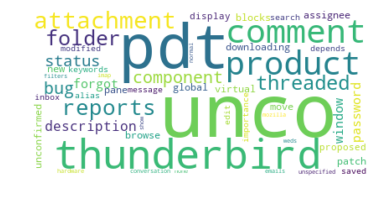

2 [('charts', 0.9276746573023805), ('examples', 0.1844226980298207), ('use', 0.15415271111915102), ('bar', 0.08968885010568788), ('graphs', 0.0816295650735376), ('visualization', 0.06675484432680408), ('websites', 0.0639033057003026), ('developers', 0.062038469455888576), ('types', 0.05369411391503806), ('interactive', 0.04353576803922005)]


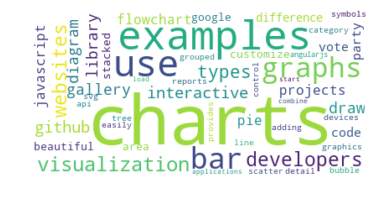

3 [('maintenance', 0.34057707487904), ('app', 0.3404581414703271), ('recently', 0.2621558111282723), ('replaced', 0.2593921203483056), ('integration', 0.2291615262197258), ('german', 0.21934936142302483), ('todoist', 0.2192969767549622), ('looking', 0.20925087334033782), ('using', 0.19466068870874498), ('base', 0.1766189663406174)]


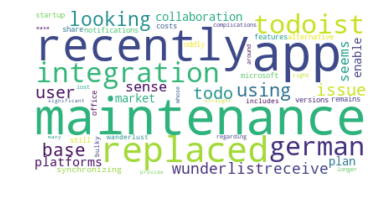

6 [('wikipedia', 0.4600878395507009), ('service', 0.27421235237221775), ('function', 0.26869129829760935), ('contents', 0.19323689261129437), ('proof', 0.17175497312099983), ('system', 0.1615661187833134), ('featured', 0.15432343919387362), ('needed', 0.14467822424425653), ('requiring', 0.1408201382644097), ('money', 0.12882459507419625)]


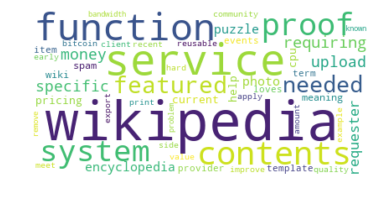

4 [('productivity', 0.40506523894075264), ('ratings', 0.3937388564173996), ('review', 0.3860973464358566), ('helpful', 0.2638331867311687), ('customers', 0.2541807530702722), ('using', 0.2462712337358782), ('tasks', 0.2079779891178886), ('app', 0.14931752295612258), ('purchases', 0.14197121176235142), ('tried', 0.1371449949319032)]


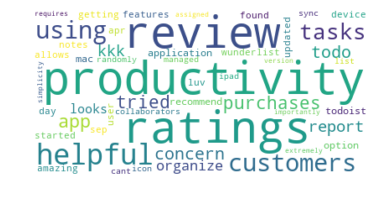

5 [('learning', 0.6073049327375355), ('deep', 0.37401096467372613), ('use', 0.26704618877030234), ('weights', 0.17898214481085903), ('gpu', 0.1780563750963201), ('training', 0.1564550817570785), ('algorithms', 0.12405314174821608), ('bias', 0.11664698403190467), ('model', 0.1104751859349785), ('neural', 0.10214325850412817)]


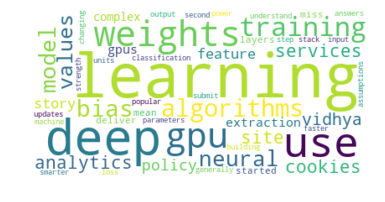

PARTICIPANT:  P02
--------------------------

5 [('computers', 0.33071371507402464), ('learning', 0.287753355027644), ('deep', 0.23842420845147647), ('neural', 0.20940466925279042), ('jen', 0.1884581832223302), ('hsun', 0.1884581832223302), ('huang', 0.1884581832223302), ('nets', 0.18602646472913886), ('essentially', 0.1448358553639141), ('burst', 0.13236654331271622)]


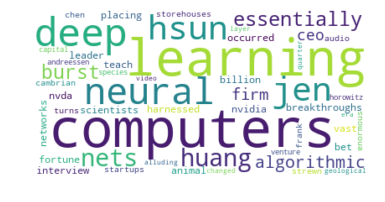

2 [('vega', 0.4717746489983471), ('chart', 0.33232494468789514), ('interactive', 0.31512011103920307), ('visualization', 0.24759135992401293), ('library', 0.191018119273332), ('tableau', 0.16389867844280387), ('designs', 0.1620876433218889), ('creating', 0.1608573635985954), ('generate', 0.12854226823280612), ('started', 0.11590624773855744)]


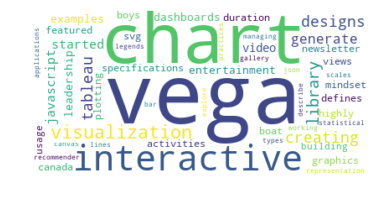

1 [('message', 0.5563145466984682), ('folder', 0.3396878702377216), ('bug', 0.31479818531784154), ('pdt', 0.2075843106081419), ('summary', 0.19988544194547728), ('thunderbird', 0.16680882102439976), ('attachment', 0.15688128645029803), ('user', 0.15377911411935996), ('selecting', 0.12792347855937447), ('description', 0.12688876129206475)]


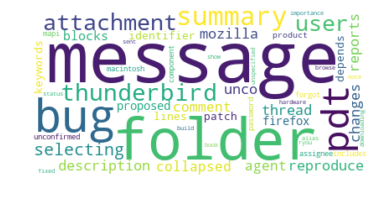

4 [('reviews', 0.8253569490761988), ('productivity', 0.2284786404095057), ('management', 0.20100562515544004), ('wunderlist', 0.10045710982166411), ('pricing', 0.09269030114804237), ('editors', 0.0861026873584656), ('solution', 0.0807212693985615), ('rating', 0.07728635739259321), ('organizer', 0.07466717419366939), ('wishlist', 0.07264914245870535)]


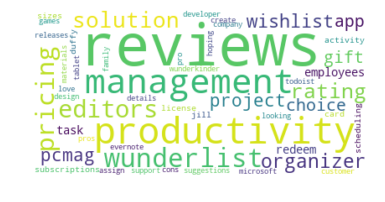

5 [('learning', 0.6060131356033772), ('deep', 0.5384163396735582), ('gpus', 0.21553039946471753), ('gpu', 0.20541909677378017), ('computations', 0.1599638161708747), ('suited', 0.1287860658529917), ('performance', 0.1179013882496843), ('memory', 0.11768400577741411), ('answer', 0.11397324883848664), ('parallel', 0.10925528644470743)]


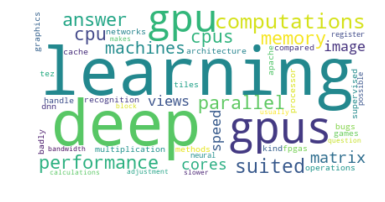

2 [('donne', 0.7269657175089846), ('uomini', 0.3634828587544923), ('sono', 0.3634828587544923), ('lune', 0.3634828587544923), ('come', 0.19385752466906261), ('gallery', 0.19385752466906261)]


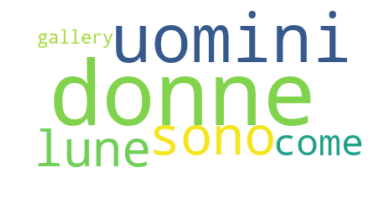

5 [('parallelizable', 0.508243205254218), ('learning', 0.3504273908720663), ('deep', 0.27948196818017557), ('computation', 0.22588586900187466), ('parallel', 0.22573543583783412), ('graphical', 0.20021702025166166), ('operations', 0.17421581184133025), ('games', 0.15591085042607208), ('machines', 0.14238792313954876), ('answers', 0.14189084538378144)]


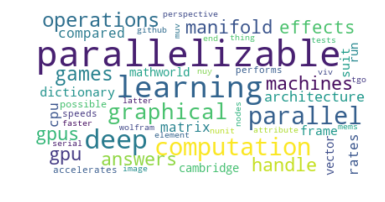

3 [('management', 0.5673738286213792), ('project', 0.4599439981679003), ('links', 0.20103142976043012), ('wunderlist', 0.19445612320738892), ('head', 0.17416504948140052), ('click', 0.16219728255629318), ('todoist', 0.16029948243530842), ('year', 0.14288184263964457), ('meaning', 0.11796059101645075), ('compare', 0.10882279875461301)]


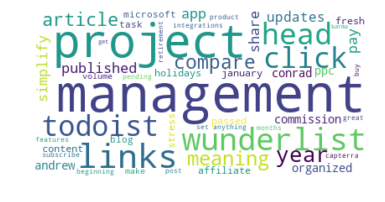

1 [('message', 0.442085087370123), ('book', 0.2984507833191221), ('bug', 0.2863110113086032), ('window', 0.27277300683573175), ('pdt', 0.20885909639533368), ('changes', 0.18271781211429217), ('attachment', 0.181280779373165), ('thunderbird', 0.1740492469961114), ('folder', 0.16838195468699751), ('reso', 0.15473524567032151)]


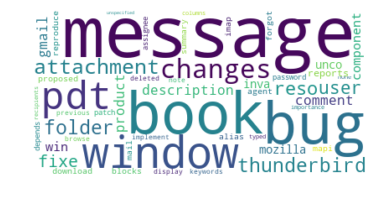

6 [('ledger', 0.6202836748917168), ('accounts', 0.3875700716868865), ('transactions', 0.21298526287441866), ('record', 0.21189896433643632), ('using', 0.20042429117742352), ('centralized', 0.12163153548553565), ('definition', 0.12012368826117212), ('currency', 0.10904845459170236), ('underlies', 0.10699117471919685), ('copy', 0.09032644145571843)]


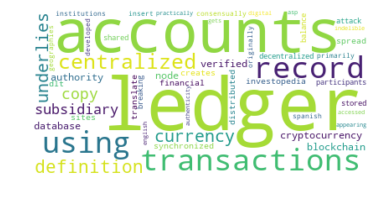

3 [('using', 0.32463377024763407), ('project', 0.30161897545708255), ('app', 0.23710387688771623), ('management', 0.22513611498583758), ('followers', 0.2234506039645532), ('year', 0.18798865601317438), ('todoist', 0.18632317539646623), ('pricing', 0.17582907673349374), ('wunderlist', 0.17563250139830833), ('makes', 0.14051030320073846)]


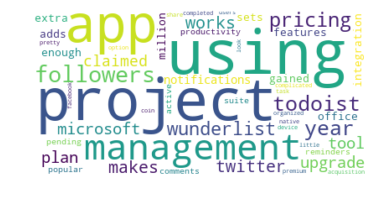

6 [('block', 0.48007960549667356), ('proof', 0.4050229120119429), ('ledger', 0.3156166911384072), ('computer', 0.20629163246094687), ('blockchain', 0.19626256142880205), ('used', 0.1724354971932034), ('generating', 0.16882296840641192), ('nodes', 0.13594333383371152), ('value', 0.12263419625558591), ('bitcoin', 0.11118544191035347)]


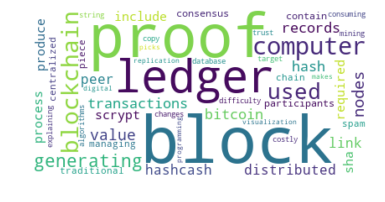

3 [('tasks', 0.7057272549467973), ('sharing', 0.20807953121990497), ('suggested', 0.17863431453784295), ('pro', 0.13168231308590148), ('wunderlist', 0.13100436624469733), ('teams', 0.1256329245101313), ('integrations', 0.1157615852975972), ('app', 0.11531430842701845), ('azure', 0.10502127283268789), ('management', 0.10501407477028961)]


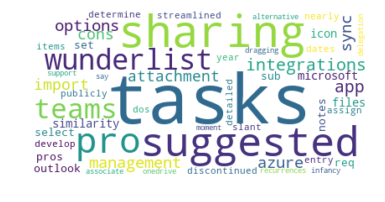

6 [('block', 0.5375150159404273), ('proof', 0.4144004385899464), ('generating', 0.19978419129017497), ('used', 0.19864251311633227), ('meaning', 0.15302089326627769), ('miner', 0.15182377549871234), ('value', 0.1491371142493671), ('hash', 0.14055384087343614), ('bitcoin', 0.12674016672618682), ('link', 0.12117390532761076)]


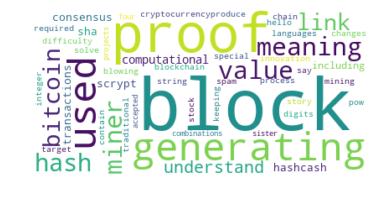

PARTICIPANT:  P03
--------------------------

5 [('layer', 0.4934514231064268), ('neural', 0.3027238298426089), ('weights', 0.2298379750362155), ('output', 0.20965507041833994), ('input', 0.20323712519949802), ('propagation', 0.1960625020022197), ('learning', 0.16962154704150084), ('computational', 0.12968802569548388), ('developed', 0.12192121973247275), ('connection', 0.11986173966942422)]


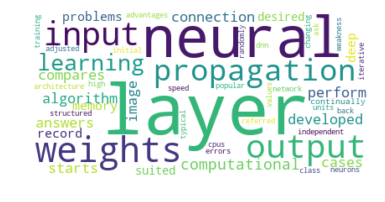

3 [('features', 0.3859215465425402), ('todoist', 0.2791868942150161), ('task', 0.25811635905117947), ('reviews', 0.20549069361356037), ('integrate', 0.1939904223145036), ('tool', 0.1807034070874828), ('looking', 0.18063222664876663), ('wunderlist', 0.17570449327045412), ('processing', 0.14349976445182458), ('collaboration', 0.14349976445182458)]


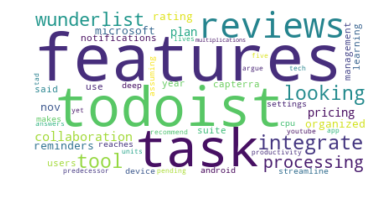

6 [('block', 0.39931287809288474), ('proof', 0.3971954290115732), ('generation', 0.3113739994752733), ('ledger', 0.3061844328173521), ('distributed', 0.18177131013734607), ('used', 0.1814063075065482), ('contain', 0.16600343311743226), ('bitcoin', 0.16335041021372904), ('node', 0.12446589710207834), ('hash', 0.12227588131729102)]


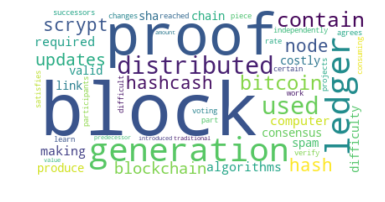

3 [('tasks', 0.495561661661478), ('features', 0.27582069390396347), ('karma', 0.2609423992120485), ('wunderlist', 0.21678170040879796), ('completing', 0.1935684801930757), ('collaborate', 0.1935684801930757), ('levels', 0.14763846271208003), ('productivity', 0.13504913643430577), ('creates', 0.12098030012067233), ('integration', 0.12017084174239075)]


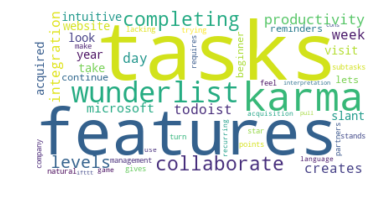

4 [('ratings', 0.356487795046292), ('reviews', 0.29452218714915157), ('task', 0.2833595386566181), ('helpful', 0.2697023767765955), ('productivity', 0.24729559737304854), ('customers', 0.2323178889065723), ('apple', 0.1818453897193883), ('organizing', 0.1628895542908151), ('ipad', 0.141526989793659), ('grocery', 0.13988106901491407)]


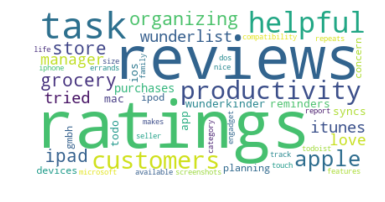

1 [('message', 0.42102456796003385), ('pdt', 0.2812860164029442), ('reports', 0.21752182297398096), ('attachment', 0.2120950831076862), ('component', 0.20127974311311286), ('product', 0.2007675809168963), ('filters', 0.19796557727364167), ('thunderbird', 0.17817795894334407), ('bug', 0.16945368105751962), ('unco', 0.16822893585513704)]


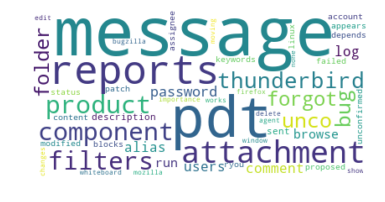

2 [('usage', 0.6495945970063116), ('visualization', 0.46549896222719495), ('tableau', 0.30244282856569166), ('public', 0.1658614004771851), ('activity', 0.16389466450314732), ('dashboard', 0.14201663254389), ('profile', 0.10519750558806665), ('audit', 0.09467775502925999), ('examples', 0.0917810121217625), ('insights', 0.08522522554163661)]


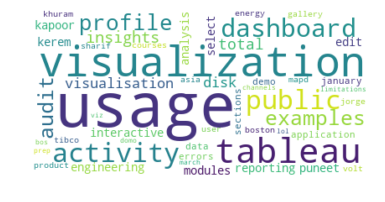

1 [('message', 0.46542767950697855), ('attachment', 0.332355609355053), ('comment', 0.2726354607990669), ('pdt', 0.22979274553064213), ('folder', 0.18889742641078208), ('mail', 0.1883773042528635), ('bug', 0.17382450132570584), ('reports', 0.16942346492513444), ('threaded', 0.16747606877656968), ('product', 0.15331437535908232)]


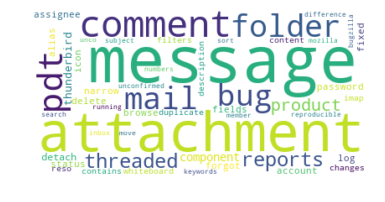

PARTICIPANT:  P04
--------------------------

1 [('message', 0.5791282419189082), ('folder', 0.31129406371906404), ('reso', 0.2503497155428982), ('attachment', 0.20359871303264776), ('imap', 0.19943761742790517), ('sending', 0.16231761893922625), ('thread', 0.15524275385470207), ('mapi', 0.13512759875633498), ('move', 0.13437654194097046), ('thunderbird', 0.12594045323182496)]


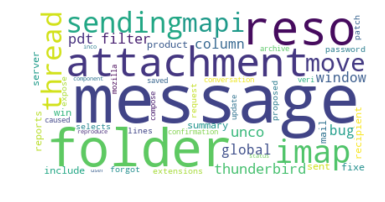

6 [('ledgers', 0.5701834577323086), ('distributed', 0.24397213240101062), ('node', 0.22574432940553282), ('blockchain', 0.19537761480362256), ('kinds', 0.18926257630610246), ('database', 0.14368462368841659), ('digital', 0.13484311715030023), ('service', 0.12662097586064777), ('record', 0.12509014297579796), ('proof', 0.12479034358442498)]


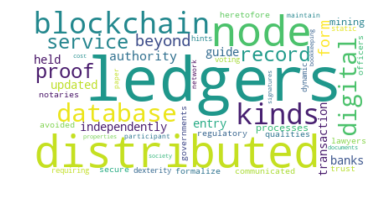

4 [('app', 0.41161379105152024), ('feature', 0.3349266543475526), ('wunderlist', 0.32900617900657847), ('helpful', 0.243339503156779), ('manager', 0.2056843689052029), ('todoist', 0.19071117729907697), ('windows', 0.1498270718228091), ('dates', 0.1426393516162518), ('ratings', 0.1321691717653571), ('essentially', 0.12352259043491319)]


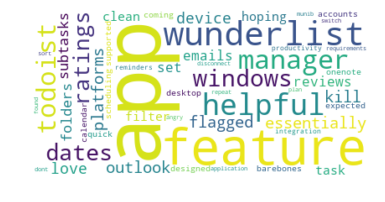

1 [('message', 0.5527788185562736), ('folder', 0.3751180412425034), ('bug', 0.24892327992306137), ('unco', 0.24258880891873247), ('status', 0.14799769069400423), ('sending', 0.14669704183908455), ('window', 0.13248417965398293), ('saved', 0.128963222143582), ('win', 0.11950958532115148), ('mail', 0.11207294004836418)]


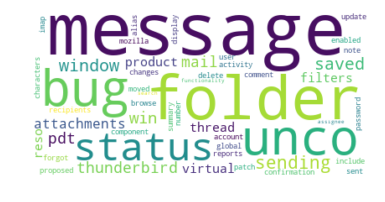

3 [('wunderlist', 0.4876998025224188), ('todoist', 0.39136656440847295), ('app', 0.29046826473761705), ('businesses', 0.2334234334880077), ('encryption', 0.19636032409552714), ('application', 0.18843575323370923), ('visit', 0.12705668029710582), ('times', 0.12062821730588319), ('quickly', 0.10581392296969824), ('sensitive', 0.10026241438411071)]


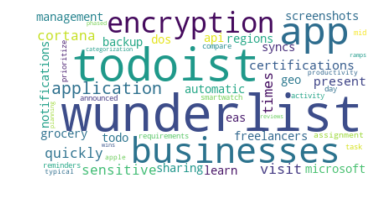

4 [('app', 0.7447893957275132), ('windows', 0.22801129704594417), ('used', 0.2231144340758871), ('love', 0.1960839338309161), ('helpful', 0.1367837234033077), ('nice', 0.13511666028684974), ('wunderlist', 0.11534349048877417), ('manager', 0.10889882247044148), ('device', 0.09350103547927206), ('fantastic', 0.09193660097599368)]


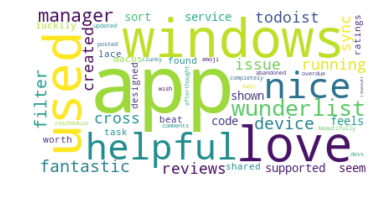

2 [('visualization', 0.569949704071792), ('tool', 0.48912296834989333), ('creating', 0.34519400711193665), ('getting', 0.18445481296057684), ('charts', 0.13965864409872247), ('infographics', 0.11355210028353539), ('guides', 0.11067288777634611), ('harvard', 0.10013261275002742), ('customize', 0.0948624752368681), ('clouds', 0.09462675023627949)]


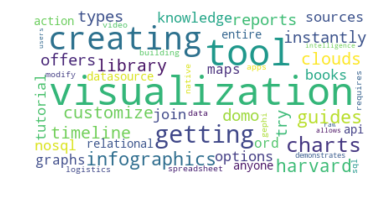

5 [('neural', 0.4746178582028872), ('output', 0.37501568597354595), ('weights', 0.3142355084441492), ('using', 0.18502052099434585), ('network', 0.17867291795600776), ('backpropagation', 0.16406936261342636), ('layer', 0.15613391791420095), ('propagation', 0.14273179213247256), ('step', 0.1358229888301625), ('learning', 0.12033224352435502)]


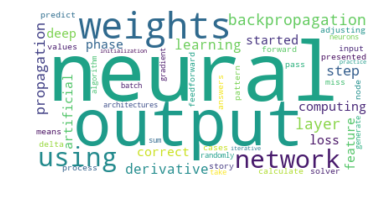

3 [('todoist', 0.45485445167085714), ('wunderlist', 0.3832684457689624), ('app', 0.27444901231472674), ('tasks', 0.26058539659273017), ('notifications', 0.17055890718074157), ('planning', 0.1488265781065282), ('views', 0.13420528056926523), ('printing', 0.12140243371997965), ('reminders', 0.11602071949164833), ('tracking', 0.11041971924032737)]


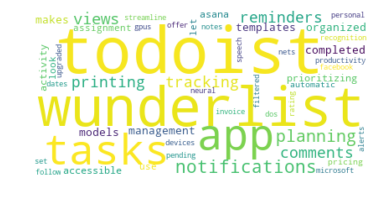

5 [('networks', 0.29805271387118326), ('image', 0.2966190541292783), ('models', 0.2931113409675799), ('used', 0.24687828763022626), ('neural', 0.23357309983354024), ('recognition', 0.22122546153792796), ('speech', 0.21011790698372237), ('researchers', 0.1722029128184532), ('gpus', 0.16853902105635848), ('deep', 0.16067919444951276)]


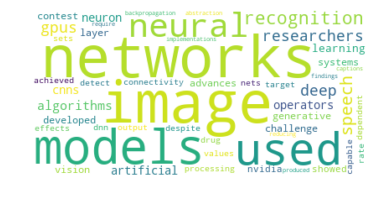

2 [('developers', 0.21573082365214366), ('person', 0.2081470718824112), ('chart', 0.20701807124811022), ('kiernander', 0.18526746774687752), ('dimple', 0.18151204610335972), ('visualization', 0.17962041649329977), ('stacked', 0.1752530100308301), ('javascript', 0.16651765750592892), ('tree', 0.1635873544281658), ('gantt', 0.16084805193146454)]


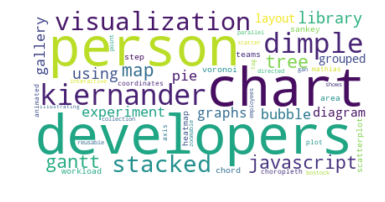

5 [('using', 0.489541447816301), ('answer', 0.23172651605097633), ('units', 0.21638038916018318), ('gpu', 0.20337454662023588), ('cpu', 0.18574497288559982), ('stack', 0.16880739579872447), ('batch', 0.1606420980945666), ('neural', 0.1580651069751693), ('layers', 0.14633834963409148), ('rotating', 0.1299597717266024)]


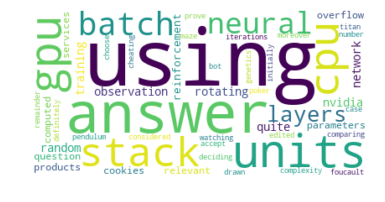

2 [('tableau', 0.5979716691281244), ('tree', 0.30341057207346694), ('interruption', 0.21532691899760883), ('visualization', 0.197496367823046), ('examples', 0.1575943392663659), ('researcher', 0.1497926393026844), ('sample', 0.13400633599911457), ('hour', 0.11078413948427701), ('storytelling', 0.10240106807479508), ('developers', 0.10113685735782231)]


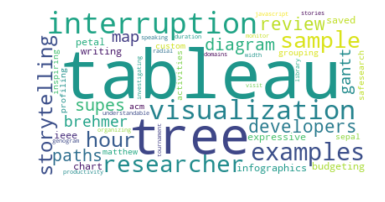

PARTICIPANT:  P05
--------------------------

6 [('uses', 0.3462907344234466), ('ledger', 0.2497978491526703), ('wikipedia', 0.23054259828048532), ('bitcoin', 0.22508558536099377), ('blockchain', 0.2201343545657907), ('links', 0.2183877657232563), ('contents', 0.216223948142057), ('block', 0.19976437463303784), ('distributed', 0.19775663057919735), ('chain', 0.16700240908249012)]


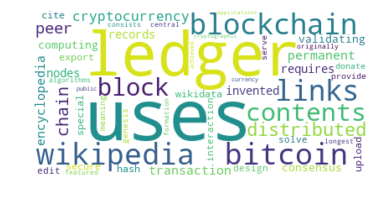

2 [('visualization', 0.4831825837731233), ('javascript', 0.3245165286681888), ('interactive', 0.29955371877063586), ('observable', 0.29955371877063586), ('try', 0.29352821293329545), ('documents', 0.2834604786901621), ('notebooks', 0.27459090887308285), ('coding', 0.27459090887308285), ('creative', 0.24944522124734267), ('using', 0.15099455742910103)]


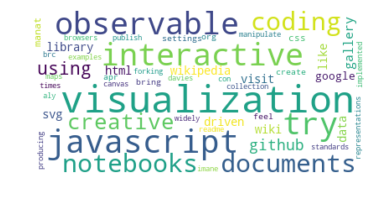

5 [('learning', 0.5403817042106435), ('training', 0.43173553525485603), ('batch', 0.20429766240125496), ('pir', 0.16056069805619758), ('reinforcement', 0.14559805235920426), ('layers', 0.13236186578109477), ('comparing', 0.13121089303517222), ('policies', 0.12718248842444324), ('neural', 0.11788824698616449), ('vidhya', 0.11356195423273731)]


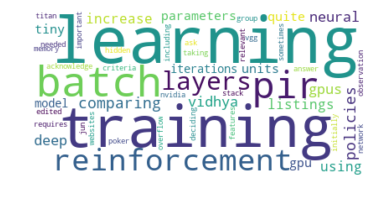

6 [('scheme', 0.3050495944019242), ('transactions', 0.29146438979293166), ('use', 0.2850202828361908), ('cryptocurrencies', 0.2618239433733115), ('verify', 0.2544138317684065), ('blockchain', 0.24408043386167674), ('consensus', 0.20364107203844034), ('ledger', 0.15236973829826564), ('centralized', 0.14865414775520316), ('hashing', 0.14573219489646583)]


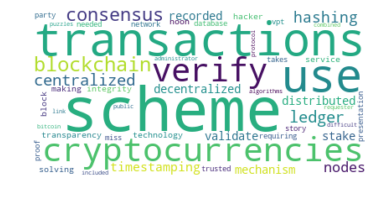

2 [('chart', 0.4950327450679799), ('timeline', 0.24317398003339363), ('jun', 0.2081491371316386), ('var', 0.20590016944308984), ('feb', 0.18214245758427178), ('javascript', 0.17948555669131436), ('interactive', 0.1736957000238526), ('aug', 0.16508379841474785), ('github', 0.1619843990373958), ('gallery', 0.14185148835281294)]


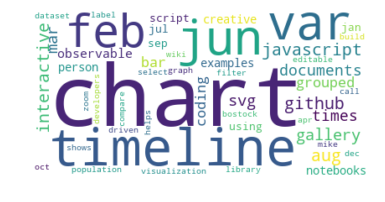

5 [('transaction', 0.30634291248433426), ('state', 0.29538447734096185), ('cryptocurrency', 0.2450743299874674), ('blowing', 0.201776320274638), ('stock', 0.19810175007320283), ('started', 0.18925066080719632), ('ping', 0.16698729953763145), ('keepin', 0.16698729953763145), ('require', 0.15521374232539603), ('understand', 0.1291507887941002)]


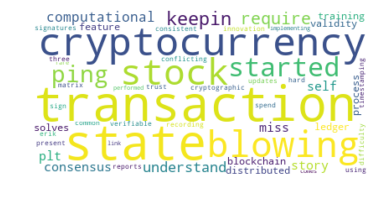

3 [('wunderlist', 0.6038940998380604), ('todoist', 0.2381935751174455), ('use', 0.23500266933652003), ('microsoft', 0.23451523123016751), ('integration', 0.16457160226533749), ('collaboration', 0.14274938771545817), ('cortana', 0.14092481614665586), ('windows', 0.1269153881876755), ('features', 0.12661483182376876), ('month', 0.12332770231199447)]


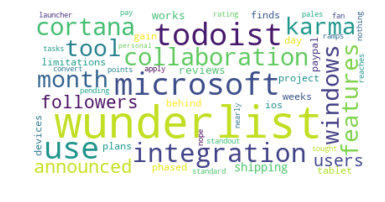

1 [('sending', 0.3804302978042237), ('attachment', 0.2513667072729039), ('message', 0.21181802788350892), ('sent', 0.20761355256616365), ('pdt', 0.18652175654559408), ('progress', 0.18505943404226285), ('window', 0.17653762359181532), ('address', 0.16280228589393658), ('summary', 0.15498727601039514), ('thunderbird', 0.14794669740599434)]


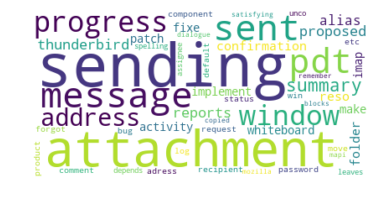

4 [('productivity', 0.7046092448447514), ('ratings', 0.3841055706410327), ('purchases', 0.23819533763778322), ('kkk', 0.21824180150058672), ('itunes', 0.11319157127662134), ('games', 0.10974444875458075), ('used', 0.10912090075029336), ('review', 0.10469009620329749), ('tried', 0.09475116301944013), ('wunderlist', 0.09210078083707816)]


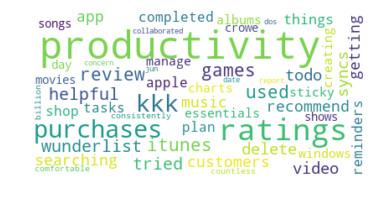

1 [('reso', 0.36660701194345213), ('unco', 0.3007289724576976), ('message', 0.2667337950562344), ('folder', 0.2622288195114774), ('icon', 0.2458495397510623), ('thunderbird', 0.23955650722092556), ('win', 0.22954979171260412), ('window', 0.20233969270624605), ('send', 0.18693963152775797), ('attachments', 0.1740030989105692)]


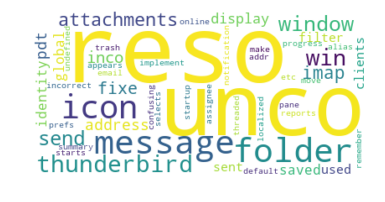

4 [('customers', 0.3244768887176018), ('productivity', 0.3167966629217403), ('use', 0.3047170781867222), ('review', 0.29743714799113496), ('nice', 0.29195644008723276), ('ratings', 0.21555236858592638), ('helpful', 0.20983696487342074), ('tried', 0.15703849421909574), ('sync', 0.12607209912857778), ('integration', 0.1258387933808648)]


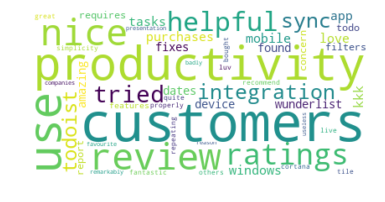

PARTICIPANT:  P06
--------------------------

1 [('mail', 0.4267000745221077), ('status', 0.42109127677813657), ('progress', 0.3714749890430078), ('window', 0.19914144498287045), ('pdt', 0.1868161094722676), ('sent', 0.17387273006310353), ('component', 0.16955827026004888), ('alias', 0.16567525643729966), ('thunderbird', 0.14971175516599736), ('send', 0.13668884059108835)]


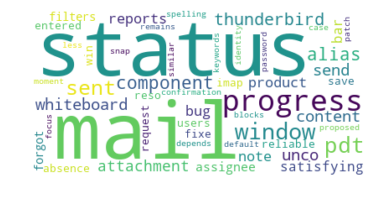

3 [('apps', 0.528897904113019), ('microsoft', 0.4254832270502202), ('wunderlist', 0.33271299130790927), ('features', 0.2885417221460269), ('todoist', 0.2524947909429409), ('collaboration', 0.17640472479162414), ('year', 0.1515490240381459), ('tasks', 0.1407796089189334), ('integrations', 0.1404481787874675), ('management', 0.09286093787446412)]


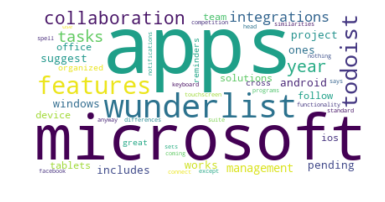

1 [('folder', 0.7185631224141901), ('option', 0.2396306000438377), ('filter', 0.23913651633240715), ('numbers', 0.2159145818951692), ('unified', 0.20361477874625128), ('reso', 0.13572332546959434), ('window', 0.127557857108009), ('snap', 0.12446822043065238), ('product', 0.10769590703928786), ('uses', 0.10304503718848543)]


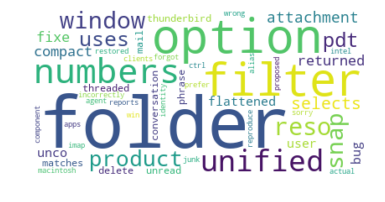

3 [('microsoft', 0.5785960783557278), ('apps', 0.4400412857456808), ('todoist', 0.3446510936053975), ('integrations', 0.18788733897364096), ('collaboration', 0.17963632757614656), ('tasks', 0.14942079393234373), ('windows', 0.13420504705543507), ('wunderlist', 0.1302729458221023), ('column', 0.09869554044154563), ('team', 0.0981733418148708)]


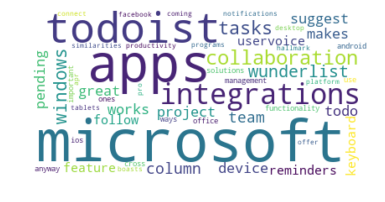

6 [('blockchain', 0.5879890139442522), ('btc', 0.19258176763330911), ('transaction', 0.18467703727743837), ('validating', 0.17970156046773983), ('operations', 0.1787527577234704), ('recorded', 0.17677958387476847), ('medium', 0.16006472435115918), ('story', 0.16006472435115918), ('writing', 0.1559605006498474), ('hacker', 0.1396217815341491)]


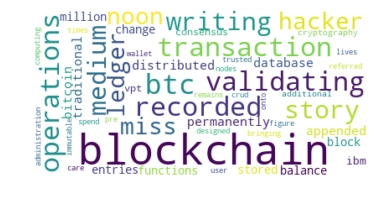

1 [('reso', 0.454975727635618), ('window', 0.34463012058163683), ('fixe', 0.31144647788062074), ('win', 0.3086478574118604), ('mail', 0.2002804056954254), ('status', 0.18721504479539353), ('product', 0.1851087538622945), ('user', 0.16711762227740626), ('folder', 0.16479076925909414), ('thunderbird', 0.12751130701170355)]


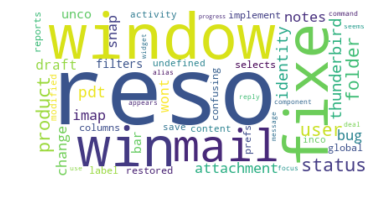

6 [('blockchain', 0.4826007489034397), ('centralized', 0.2814975582177247), ('database', 0.25482258360477167), ('traditional', 0.25271182810162923), ('requires', 0.238626292235096), ('ledger', 0.2137054047164845), ('consensus', 0.17220920962590497), ('distributed', 0.1493863023260862), ('block', 0.14689653062065147), ('decentralized', 0.13112797648623126)]


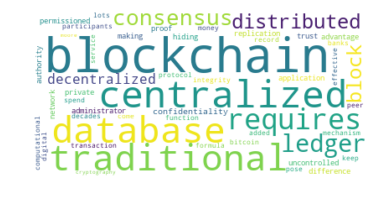

4 [('tasks', 0.4970224673770423), ('pro', 0.3732740163158195), ('todoist', 0.22223263064835125), ('projects', 0.21736622267794942), ('productivity', 0.2141219506976815), ('collaboration', 0.2141219506976815), ('app', 0.17452322049342245), ('supports', 0.1622445952425059), ('coded', 0.1385014837436026), ('assign', 0.12747467427545908)]


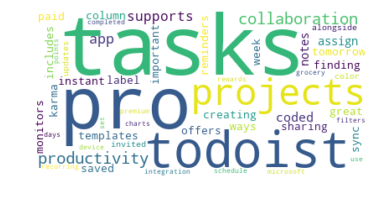

2 [('visualization', 0.7563017505155011), ('library', 0.2765170592493774), ('chart', 0.2746767551623462), ('using', 0.19189745908602268), ('visualisation', 0.11758422738114135), ('interactive', 0.10564369699527497), ('javascript', 0.09642646168696238), ('building', 0.09075431688184694), ('types', 0.08842333899061829), ('reporting', 0.08437315397609209)]


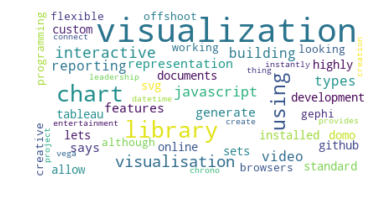

1 [('folder', 0.40970058071465265), ('sending', 0.3187731853840212), ('window', 0.304409769118429), ('user', 0.24385079648213673), ('mail', 0.2215193914709942), ('win', 0.17387153921353238), ('status', 0.16271817080303919), ('confirmation', 0.13942021255821946), ('imap', 0.13256369866562637), ('unco', 0.11702254764095975)]


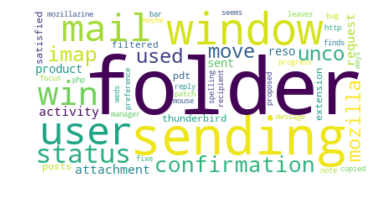

6 [('block', 0.377610375906237), ('transactions', 0.3541741193766221), ('proof', 0.30292051608362963), ('require', 0.2482438582346558), ('used', 0.19300085879652115), ('blockchain', 0.17656781465986085), ('generating', 0.17515987282350476), ('puzzle', 0.14432488298660417), ('miners', 0.13286291004108342), ('consensus', 0.12936651767158122)]


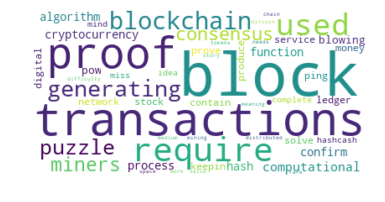

5 [('learning', 0.748314401153718), ('deep', 0.4664817046153047), ('networks', 0.20408574576919578), ('neural', 0.1943673769230436), ('machine', 0.16881680091240386), ('structured', 0.09528226846988333), ('artificial', 0.08795286320296923), ('supervised', 0.05831021307691309), ('recognition', 0.05831021307691309), ('article', 0.05190376203491012)]


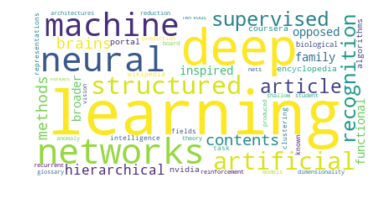

PARTICIPANT:  P07
--------------------------

2 [('charts', 0.449647558577352), ('plot', 0.3191344870561283), ('matplotlib', 0.24983671272394042), ('powerful', 0.20059882043528066), ('try', 0.19148069223367697), ('libraries', 0.1860990595113496), ('visualization', 0.16617788647422682), ('reasons', 0.1659499332691867), ('extensions', 0.15865543070790378), ('created', 0.15080883338990525)]


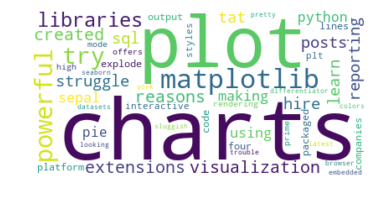

6 [('block', 0.399326220151077), ('proof', 0.36838568977617525), ('used', 0.3000161666362588), ('ledger', 0.2424846574091353), ('generation', 0.22915330308911683), ('bitcoin', 0.223674250835228), ('required', 0.22335195364382274), ('hash', 0.198212772714215), ('contain', 0.1469675192807838), ('distributed', 0.13504252319879037)]


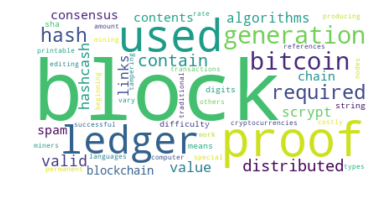

2 [('visualization', 0.7465243723824366), ('libraries', 0.27160086666588057), ('chart', 0.18483947870316875), ('series', 0.15636659151253743), ('python', 0.12148731636618966), ('beta', 0.11491633974071641), ('docs', 0.0983596301449832), ('alpha', 0.08676138796271185), ('documentation', 0.08574942115203665), ('coding', 0.08423414444097255)]


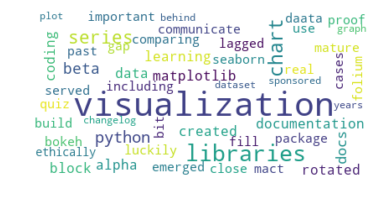

5 [('deep', 0.45143892985420747), ('recognition', 0.2839408764991767), ('speech', 0.2666111516424195), ('models', 0.25727976133493474), ('neural', 0.21756164622414617), ('image', 0.1657432659377041), ('systems', 0.1546344679526033), ('methods', 0.1493022449197549), ('algorithm', 0.1288620566271694), ('generative', 0.12575159319134116)]


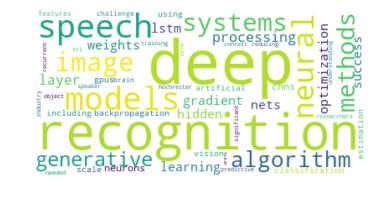

2 [('plot', 0.506359730681919), ('matplotlib', 0.4570221158975269), ('boxplot', 0.2967469988640192), ('import', 0.24467220184974506), ('years', 0.21552747511076553), ('minimum', 0.1691282501265519), ('temperatures', 0.16687320679153123), ('whisker', 0.16662264642097335), ('pandas', 0.16349064178900016), ('series', 0.15078433992051818)]


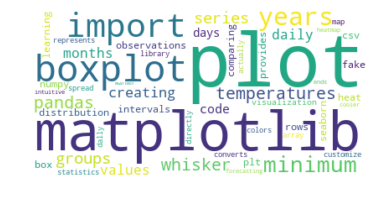

4 [('app', 0.5673096355346205), ('todoist', 0.3383760232826328), ('ratings', 0.29022765633332537), ('wunderlist', 0.22534799411514092), ('productivity', 0.21116525322677546), ('microsoft', 0.18879257001843427), ('reviews', 0.1686170305616789), ('manage', 0.14578255548540306), ('reminders', 0.11903346273578781), ('twitter', 0.11903346273578781)]


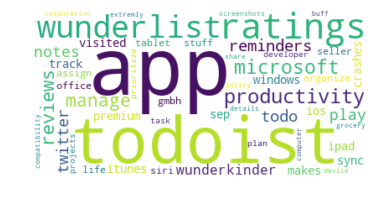

2 [('plots', 0.5945631646668372), ('graphs', 0.37698474735753207), ('overlapping', 0.19414307417692644), ('answers', 0.191109588642912), ('layered', 0.16684170437079615), ('drawing', 0.1607747333027672), ('jitter', 0.14257382009868036), ('using', 0.12984877050310362), ('sex', 0.12437290689459352), ('visualization', 0.11361767419021565)]


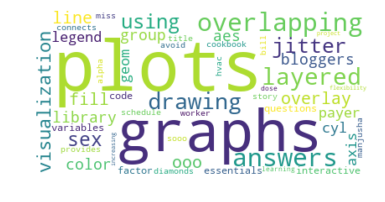

4 [('app', 0.48403356539392434), ('ratings', 0.3184904872666342), ('reminding', 0.23732393649508202), ('makes', 0.21634833604728435), ('device', 0.21634833604728435), ('wunderkinder', 0.16134452179797476), ('productivity', 0.16134452179797476), ('gmbh', 0.1592452436333171), ('extremly', 0.1592452436333171), ('helpful', 0.11866196824754101)]


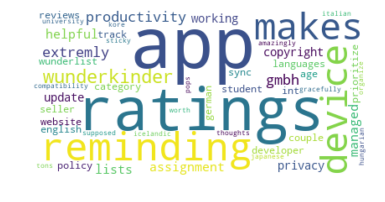

1 [('bug', 0.3182501773740731), ('mail', 0.30600978593660866), ('message', 0.2847931074450038), ('user', 0.2725527160075395), ('pdt', 0.2564574349099701), ('comment', 0.24051189491556776), ('delete', 0.21725798242373112), ('status', 0.21526478992443082), ('attachment', 0.181380517436326), ('folder', 0.1587910024442561)]


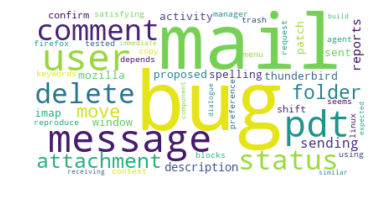

3 [('app', 0.4828480279509494), ('wunderlist', 0.4094480530060249), ('features', 0.3882239638653238), ('todoist', 0.3585439751504428), ('project', 0.17421439836325464), ('microsoft', 0.16792212907511087), ('integrations', 0.14850705621577573), ('collaboration', 0.1259555681167224), ('productivity', 0.11938550141644354), ('karma', 0.118238102082624)]


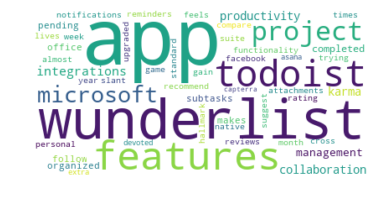

1 [('message', 0.45145555045215646), ('folder', 0.43123632721067734), ('reso', 0.29231612434638227), ('mail', 0.2746418040904139), ('pdt', 0.19075261468929255), ('attachment', 0.18444867271057666), ('thunderbird', 0.1804795240573111), ('bug', 0.15663908854221112), ('window', 0.15503027680990242), ('comment', 0.1515280868217269)]


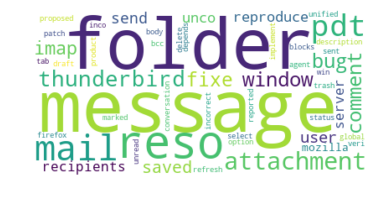

PARTICIPANT:  P08
--------------------------

5 [('learning', 0.44018338793607065), ('networks', 0.3752402234737698), ('computing', 0.32622165769546835), ('weights', 0.2931806624081955), ('layer', 0.2495913681559717), ('neural', 0.1594755539167487), ('gpus', 0.1550671073675642), ('gpu', 0.149446338017354), ('image', 0.1417815478524289), ('architectures', 0.13262934727989795)]


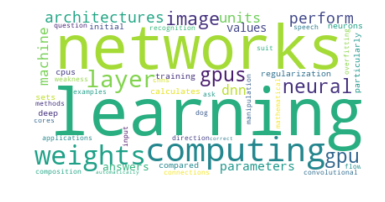

6 [('ledgers', 0.33973757239282787), ('proof', 0.2909071442099713), ('distributed', 0.25745101409144755), ('node', 0.2356292031796697), ('links', 0.1555971673445528), ('bitcoin', 0.1412658492996598), ('pow', 0.1381017920689691), ('provided', 0.13789108903473887), ('database', 0.12153702186123563), ('allows', 0.11688399652198464)]


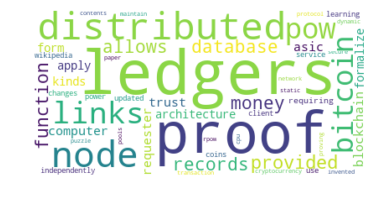

1 [('folder', 0.3949888652122394), ('filters', 0.37078809020348585), ('component', 0.2848534767051471), ('alias', 0.24539733753611473), ('books', 0.24409004578363924), ('product', 0.22242635388547383), ('whiteboard', 0.2074858767143253), ('message', 0.2058181181333368), ('reso', 0.15168603690142604), ('pdt', 0.14977828364076406)]


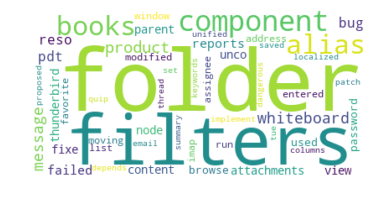

2 [('visualization', 0.4933043464058406), ('using', 0.31948477293822763), ('chart', 0.2264522107423363), ('library', 0.21874433032974505), ('tool', 0.21813877774909646), ('design', 0.16878440834472402), ('interactive', 0.1431653463638284), ('browsers', 0.12621155534705927), ('svg', 0.1213137934977704), ('video', 0.11980678985183536)]


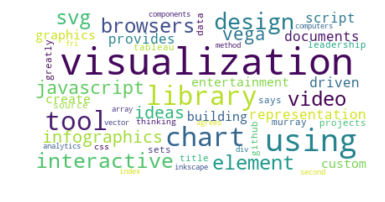

3 [('wunderlist', 0.568916177872639), ('todoist', 0.3553202530361408), ('project', 0.29169556242348493), ('management', 0.21521101689575345), ('lists', 0.19582991218469123), ('microsoft', 0.17087195736340938), ('features', 0.1534433770645127), ('collaboration', 0.1332450948885528), ('year', 0.1282226716997494), ('day', 0.11870926635525611)]


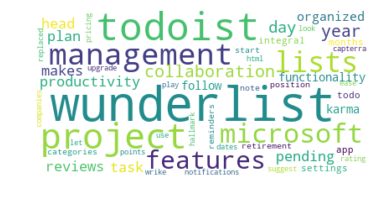

4 [('ratings', 0.39264499467506475), ('lists', 0.28543278192818605), ('todoist', 0.24878938424821623), ('task', 0.2086512082660239), ('app', 0.18882599971138841), ('organizing', 0.175744785152012), ('preview', 0.1668238894377574), ('complete', 0.165734006250948), ('productivity', 0.16393098962091765), ('wunderlist', 0.1620023897430245)]


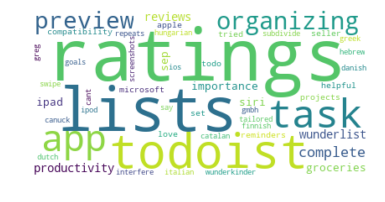

PARTICIPANT:  P11
--------------------------

3 [('apps', 0.5343008510190782), ('features', 0.3578258581425157), ('tool', 0.2131603906901159), ('collaborate', 0.20477833434515594), ('platforms', 0.18550969455002408), ('manager', 0.1726263399206059), ('integrations', 0.16300703929395607), ('plans', 0.13776015778714806), ('existing', 0.13660588316551883), ('allow', 0.134566989386929)]


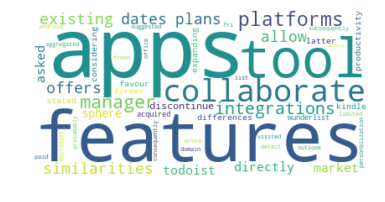

5 [('weights', 0.3824205795087206), ('neural', 0.2923345268770056), ('layer', 0.2722752174429518), ('process', 0.24190803818182866), ('guesses', 0.20248969605218883), ('values', 0.18010494989204023), ('function', 0.1747286827310838), ('neurons', 0.17408767271165915), ('learning', 0.15557573097017655), ('loss', 0.14179904637022572)]


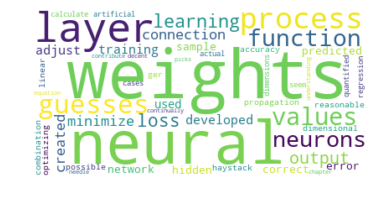

3 [('features', 0.32935471287604884), ('apps', 0.26141944967246117), ('collaborative', 0.19933218110871037), ('dates', 0.18658721931175298), ('platforms', 0.1850427458489155), ('tool', 0.18266328791495062), ('lists', 0.18163983092091107), ('todoist', 0.17245182390934746), ('productivity', 0.17122606719651245), ('android', 0.1585265830580574)]


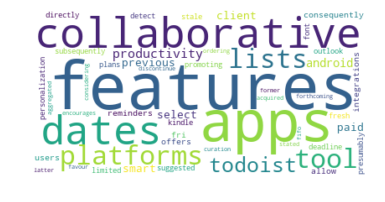

2 [('representation', 0.5038411003774901), ('visualization', 0.47306667707213207), ('library', 0.3210095308703753), ('use', 0.27877143470322063), ('represented', 0.13706999421472524), ('numbers', 0.12461683979322562), ('svg', 0.11826666926803302), ('binary', 0.09622066620911161), ('video', 0.09373787913999816), ('ideas', 0.09144258518160435)]


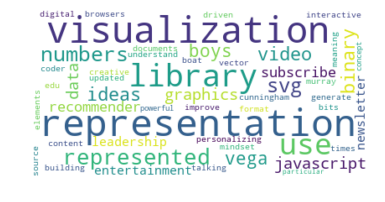

5 [('learning', 0.5221150589488938), ('gpu', 0.2622495729880288), ('vidhya', 0.25923532024413715), ('training', 0.24796421936395727), ('use', 0.20822699747425882), ('deep', 0.19944781105432574), ('graphics', 0.17282354682942475), ('cpu', 0.16927017892863677), ('performance', 0.16906651320269814), ('unit', 0.1655455033156526)]


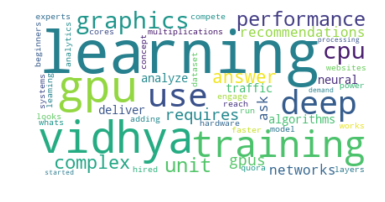

1 [('reso', 0.3516347316261008), ('message', 0.33824557139957745), ('mail', 0.29492337854746875), ('window', 0.2693896333326011), ('bug', 0.23508881607707385), ('unco', 0.22392300189173395), ('pdt', 0.2058702947624779), ('thunderbird', 0.20413445753851095), ('fixe', 0.16744511029814327), ('comment', 0.1635158664976848)]


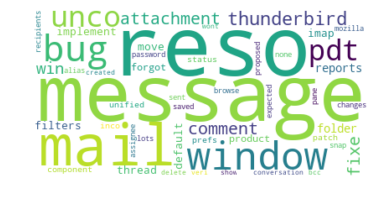

5 [('learning', 0.4301698890914071), ('gpu', 0.3897265661853774), ('computations', 0.30327582483594406), ('gpus', 0.27329881842559484), ('training', 0.22396211077759673), ('vidhya', 0.197704483996775), ('using', 0.19253839594987146), ('performance', 0.16835772465350374), ('cpu', 0.16422440210327224), ('deep', 0.1453735279305377)]


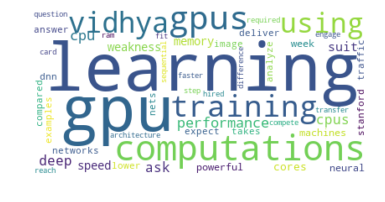

2 [('libraries', 0.5067848082123196), ('representation', 0.3450776310511351), ('visualization', 0.27262029848903585), ('sets', 0.19598899291202243), ('use', 0.1703876865556474), ('vega', 0.16992689189677), ('starting', 0.13373487994491767), ('twelve', 0.1266962020530799), ('says', 0.1104524797329005), ('includes', 0.1104524797329005)]


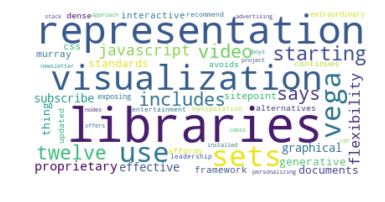

4 [('app', 0.5328013723516866), ('helpful', 0.3261173500568712), ('review', 0.3052534265345123), ('ratings', 0.2695568804802413), ('customers', 0.2530528071479547), ('todoist', 0.18078115552043933), ('tried', 0.1535769666524987), ('purchases', 0.1498829206118583), ('productivity', 0.13867932057137897), ('sep', 0.12891770926457558)]


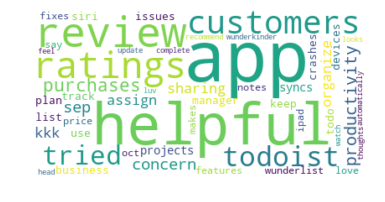

6 [('proof', 0.36112779535030004), ('consensus', 0.26609416499495786), ('cryptocurrency', 0.24638348610644248), ('blockchain', 0.2365281466621848), ('transactions', 0.21188979805154054), ('ledger', 0.21188979805154054), ('blowing', 0.20203445860728284), ('stock', 0.18012775299477524), ('keeping', 0.14654461260591883), ('require', 0.14349159984329554)]


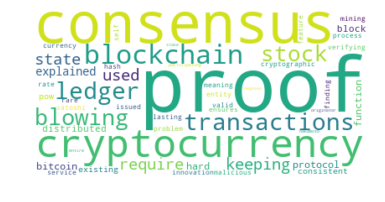

5 [('gpu', 0.5548661511315415), ('learning', 0.4282119209819505), ('cpu', 0.3528224982738606), ('performance', 0.2336902689517735), ('benchmarks', 0.16073632084500666), ('computing', 0.15016156289467728), ('geforce', 0.1430558690085673), ('training', 0.13879785671075032), ('gpus', 0.13871653778288537), ('desktop', 0.13313263806949518)]


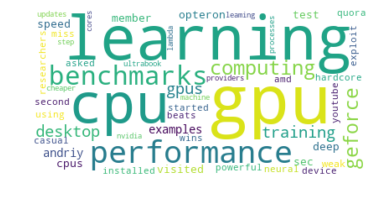

2 [('visualizing', 0.7972754189957305), ('pie', 0.15036950998726603), ('visualising', 0.12462120485243999), ('mike', 0.10355636065160773), ('articles', 0.09646345923711405), ('projection', 0.0839440968823359), ('ginzburg', 0.08258031646848434), ('bostock', 0.08227765640812669), ('selections', 0.0771378187567411), ('map', 0.07442004598229938)]


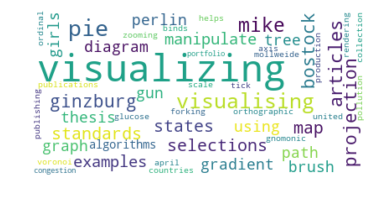

4 [('app', 0.6794759605700067), ('productivity', 0.4521429522737795), ('ratings', 0.3599513221533372), ('purchases', 0.1558552116540223), ('importance', 0.13699112108266265), ('kkk', 0.09804575256031178), ('todo', 0.09447763181840167), ('reviews', 0.0872047017587982), ('business', 0.08493449507125084), ('sep', 0.08123217859910142)]


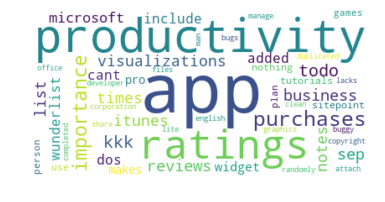

2 [('mike', 0.391536595830422), ('bostock', 0.3307565466581905), ('image', 0.21343691686062716), ('tree', 0.18092665800106142), ('infovis', 0.1753952682601636), ('diagram', 0.1540703572040289), ('follow', 0.14841639914149574), ('animation', 0.14710570886336302), ('selection', 0.12094843883730477), ('stacked', 0.11882653640156259)]


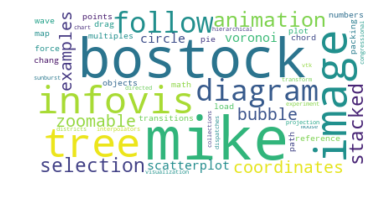

1 [('folder', 0.3902801041862066), ('bug', 0.3012235411966581), ('thunderbird', 0.21655293565611472), ('pdt', 0.20301837717760754), ('attachment', 0.20301837717760754), ('unco', 0.20301837717760754), ('reports', 0.19625109793835396), ('message', 0.17945232241503037), ('changes', 0.1761796356840572), ('product', 0.16918198098133963)]


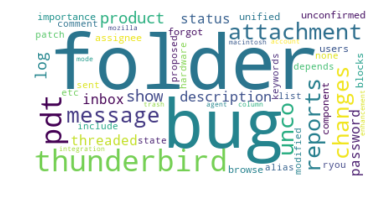

PARTICIPANT:  P12
--------------------------

3 [('lists', 0.39773676166651845), ('microsoft', 0.2587810911286427), ('wunderlist', 0.2177481485606761), ('day', 0.20872170340378923), ('dates', 0.20159809577908655), ('family', 0.17951491214250817), ('due', 0.17397967648817836), ('windows', 0.16741440567730373), ('android', 0.16526769689310275), ('accessible', 0.16418714002569304)]


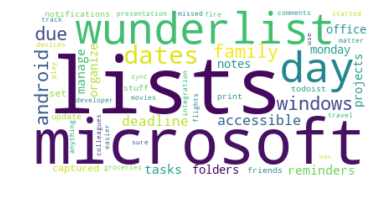

2 [('visualization', 0.5208690285264911), ('plot', 0.3791408536373768), ('examples', 0.3171698801456674), ('lattice', 0.24318799124332927), ('packages', 0.24245549729380117), ('using', 0.16906660456315664), ('tableau', 0.14283632015797953), ('matplotlib', 0.13624387461222665), ('graphs', 0.1345338512906821), ('charts', 0.13111641696552992)]


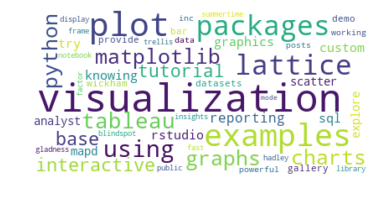

5 [('neural', 0.4417876678477696), ('weights', 0.3695933629806118), ('answers', 0.30382325962909756), ('learning', 0.30231545188900283), ('layer', 0.2592059647452521), ('using', 0.2156165068335531), ('initial', 0.15605810109980942), ('neuron', 0.1308295090196856), ('filter', 0.11911681146748739), ('values', 0.10629897607849455)]


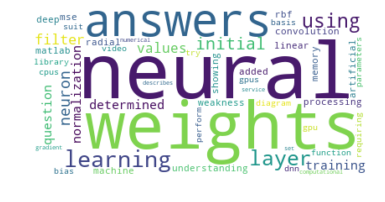

6 [('block', 0.4751847872209443), ('used', 0.3531097144953939), ('required', 0.2324828385735967), ('generation', 0.21590136829146941), ('algorithm', 0.19922486368546585), ('hash', 0.17958151194337174), ('computational', 0.15397505237520234), ('transactions', 0.14830608008806545), ('contain', 0.14729719518950715), ('bitcoin', 0.14325527024781487)]


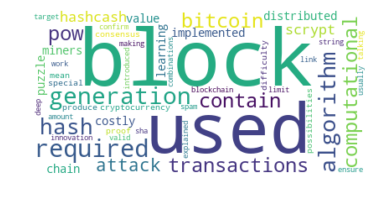

4 [('microsoft', 0.42929185737971015), ('management', 0.29986194763186474), ('productivity', 0.27690600905717655), ('task', 0.2741695895870418), ('wunderlist', 0.2426040118385337), ('todo', 0.2051687010112759), ('todoist', 0.1965602240457678), ('rating', 0.18488409824126176), ('project', 0.18221276243658768), ('tracking', 0.13948933187400311)]


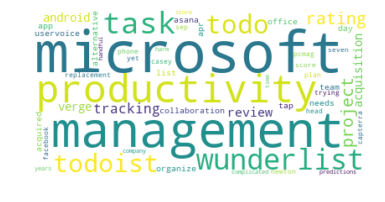

6 [('database', 0.26725740308425877), ('blockchain', 0.2639579289721074), ('hacker', 0.23123544308185207), ('noon', 0.23123544308185207), ('story', 0.18892269747778928), ('recorded', 0.17342658231138905), ('sep', 0.17317913935464016), ('difference', 0.15690976494839962), ('mechanism', 0.15690976494839962), ('ratings', 0.14684821026657854)]


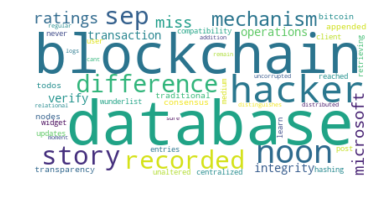

1 [('message', 0.4090161264248997), ('reso', 0.339792112529265), ('bug', 0.3167813599877798), ('pdt', 0.2272311813471665), ('folder', 0.216301073889961), ('thunderbird', 0.18753763321310452), ('fixe', 0.1685537623663792), ('thread', 0.16663619965458878), ('product', 0.15467660253512008), ('mail', 0.15368930507212997)]


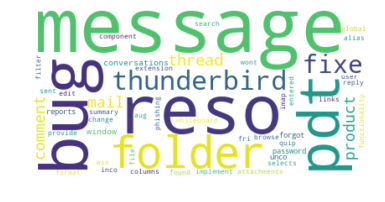

PARTICIPANT:  P13
--------------------------

2 [('product', 0.3616125172367568), ('using', 0.2825032022121262), ('patina', 0.23147900240276784), ('visualization', 0.19062499025819502), ('collecting', 0.16089347700640813), ('heatmaps', 0.15985545457410874), ('javascript', 0.15899317111750164), ('utilization', 0.14636116295421644), ('gallery', 0.1444511127835838), ('series', 0.13375127917293106)]


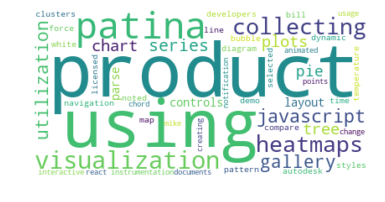

4 [('helpful', 0.4146890912181415), ('ratings', 0.3518763277956374), ('customers', 0.2799694335895954), ('concern', 0.1746059331444806), ('nice', 0.1538470808484324), ('todo', 0.14310241650069522), ('shop', 0.1338645487441018), ('okay', 0.1250086954010817), ('found', 0.12156947655299068), ('review', 0.11898839197350351)]


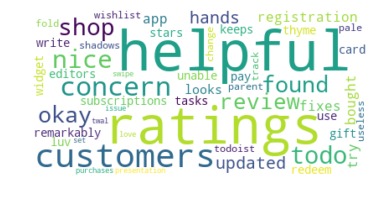

3 [('yes', 0.5418148408833526), ('shared', 0.26472587043406404), ('tasks', 0.24182696288014047), ('plan', 0.18800302403455668), ('phone', 0.18013977968330144), ('wunderlist', 0.15297584465169248), ('unlimited', 0.14997026571577887), ('collaborate', 0.1494016426738492), ('sync', 0.1451126003004373), ('backgrounds', 0.13601432653336396)]


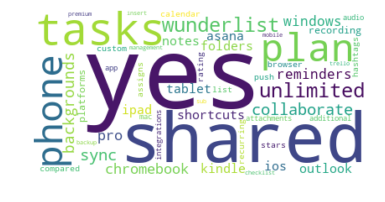

1 [('pdt', 0.35976565352947926), ('comment', 0.3581523546347283), ('attachment', 0.31893919614326316), ('bug', 0.26404325244091825), ('snap', 0.263573223218638), ('thunderbird', 0.2596742110408475), ('window', 0.23238112579631398), ('restored', 0.1349058213515514), ('reports', 0.1296016778783326), ('move', 0.11897176953692226)]


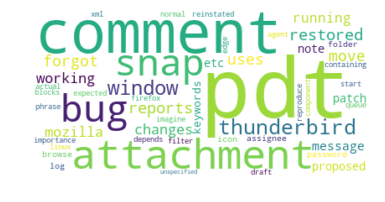

5 [('neural', 0.4663446231910286), ('gpu', 0.35314035588206133), ('weights', 0.2684250083272616), ('answers', 0.2007773797555268), ('gpus', 0.17229831879729607), ('model', 0.15877076484213645), ('learning', 0.14415626568423157), ('input', 0.1411734806716534), ('vidhya', 0.13326734568360524), ('training', 0.13151217788402253)]


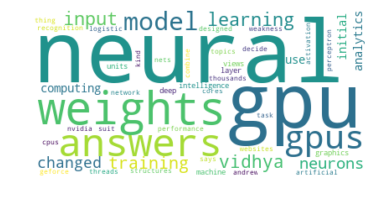

6 [('used', 0.4000655381369838), ('required', 0.25904565198724977), ('hash', 0.24261530335114062), ('bitcoin', 0.18864223235231733), ('transactions', 0.1793647455153181), ('generation', 0.1758500952783457), ('centralized', 0.12685911748989992), ('cryptocurrency', 0.12433048589933858), ('response', 0.12053280979355323), ('provider', 0.12036944460311799)]


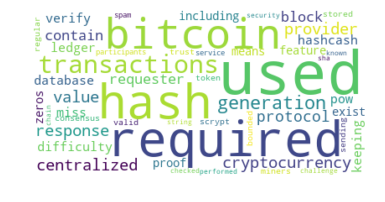

2 [('fed', 0.28564292739428704), ('tiff', 0.27335721008700586), ('disk', 0.25510643032445285), ('timeline', 0.24942814297736704), ('task', 0.21807148220424064), ('virtual', 0.20041554607743595), ('fob', 0.1993573362604311), ('feb', 0.19804433117299258), ('interruption', 0.18121433028239714), ('image', 0.16719908485296034)]


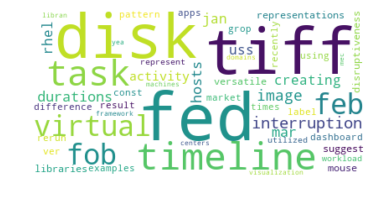

1 [('levels', 0.264015822041148), ('times', 0.264015822041148), ('tamme', 0.2568802592832792), ('emt', 0.2568802592832792), ('market', 0.21121265763291844), ('usage', 0.21121265763291844), ('examples', 0.21121265763291844), ('libraries', 0.21121265763291844), ('timeline', 0.21121265763291844), ('graph', 0.21121265763291844)]


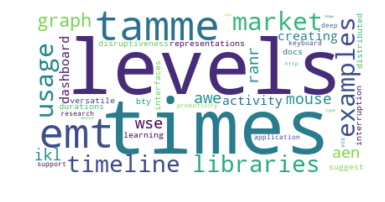

3 [('tasks', 0.3844029232330331), ('plan', 0.37210322954386865), ('sharing', 0.32756673868519876), ('phone', 0.25286573057401024), ('collaborate', 0.2446424547829855), ('outlook', 0.21483308004052087), ('backgrounds', 0.17596027722227575), ('wunderlist', 0.17371670108539725), ('push', 0.1562422400294697), ('unlimited', 0.1351913706297877)]


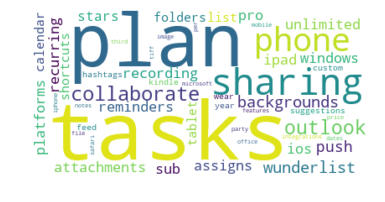

5 [('weight', 0.457543189763164), ('neural', 0.41597949242663496), ('initialization', 0.33480563344012093), ('training', 0.3216657613916953), ('inputs', 0.1535487905087451), ('tiff', 0.1499790006708276), ('answers', 0.13205698172274125), ('machine', 0.12566008248759686), ('understanding', 0.11775922279618047), ('neurons', 0.11130517030916763)]


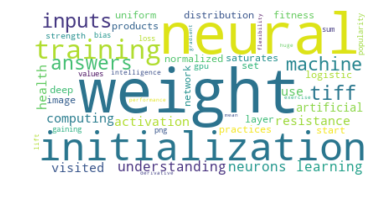

4 [('ledger', 0.3208914110278252), ('distributed', 0.2575054532939339), ('use', 0.24806657744497157), ('node', 0.2411164362665564), ('secured', 0.21919676024232398), ('blockchain', 0.17657516797298325), ('expensive', 0.17054577199341797), ('requires', 0.17054577199341797), ('mac', 0.17054577199341797), ('todoist', 0.17054577199341797)]


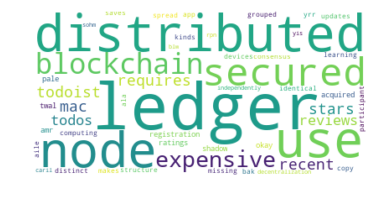

6 [('requirement', 0.33130786418179764), ('consensus', 0.26844570030102016), ('cryptocurrency', 0.24080676427335027), ('stock', 0.23441737209384855), ('transactions', 0.21454383765814658), ('bitcoin', 0.2123983992815651), ('feature', 0.18665313876258752), ('mining', 0.18508288493736838), ('proof', 0.16921427233624856), ('keeping', 0.15523080672166378)]


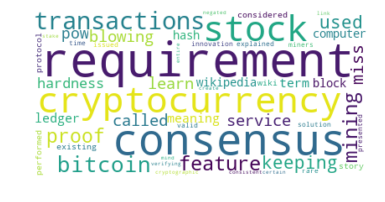

PARTICIPANT:  P14
--------------------------

6 [('database', 0.4221239776429397), ('blockchain', 0.4058895100321361), ('ledger', 0.2425294126093981), ('traditional', 0.20108287652968213), ('centralized', 0.19611786723265293), ('decentralized', 0.17129282074750699), ('services', 0.14895027891087564), ('policy', 0.1369758447239229), ('stack', 0.13653775566830267), ('recorded', 0.13281399869553076)]


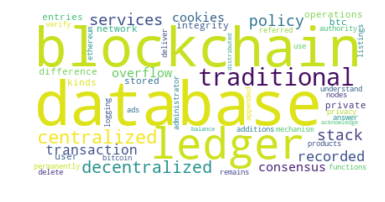

4 [('todoist', 0.35231365419511507), ('wunderlist', 0.33337205988354973), ('con', 0.2828005819922532), ('productivity', 0.22959622839141533), ('tasks', 0.17253782839472612), ('filters', 0.17219717129356152), ('column', 0.1557974406941747), ('works', 0.1465725922320196), ('notes', 0.13672590121113068), ('app', 0.13518427791751736)]


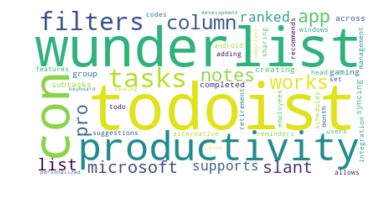

1 [('send', 0.4995591063890423), ('mail', 0.28810629127898685), ('progress', 0.2845812898829994), ('status', 0.21497161733893633), ('reso', 0.2127013882775378), ('confirmation', 0.15022819073826096), ('message', 0.14475358265669105), ('win', 0.13867831277889814), ('fixe', 0.13455765623844237), ('spelling', 0.11805135989863345)]


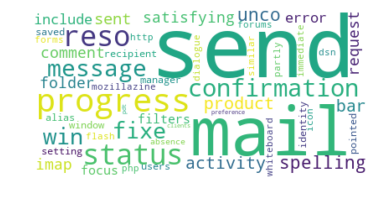

2 [('charts', 0.35972557548598816), ('using', 0.3587136370363096), ('javascript', 0.3282366630773637), ('visualization', 0.3138003283586833), ('library', 0.3031733687351677), ('frameworks', 0.2075863650857487), ('result', 0.13461661251015217), ('noon', 0.12992701246812313), ('api', 0.12764759119675256), ('install', 0.12384855574446825)]


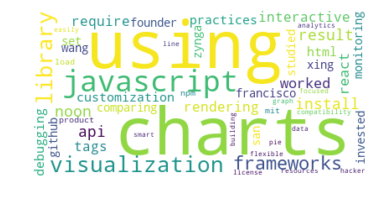

1 [('link', 0.436218033431756), ('user', 0.2793627300717807), ('product', 0.25188442875324496), ('dangerous', 0.1923769427043766), ('lists', 0.1843612367583609), ('comment', 0.1831886754569054), ('detection', 0.18248645220098725), ('pdt', 0.17819245675915846), ('scam', 0.16268172095436845), ('potentially', 0.15843784997295016)]


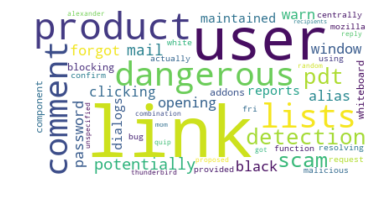

3 [('apps', 0.4784483739567754), ('todoist', 0.36665922979757487), ('wunderlist', 0.2428206819851489), ('microsoft', 0.21555147521404228), ('integration', 0.20882578650722805), ('features', 0.20834458698500136), ('collaboration', 0.18550011108917352), ('pending', 0.17416432445130875), ('differences', 0.13343234534576073), ('use', 0.11494453446064432)]


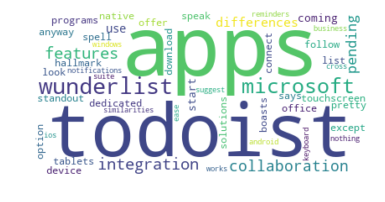

2 [('chart', 0.7818751942881331), ('projects', 0.3358218047598211), ('chartist', 0.17487487377729785), ('library', 0.12491062412664132), ('visualization', 0.12338026217542085), ('github', 0.12314291051435237), ('bar', 0.11688656416618817), ('api', 0.09740547013849014), ('line', 0.07792437611079212), ('customization', 0.07143067810155944)]


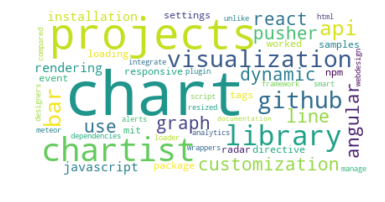

5 [('deep', 0.5100883123114229), ('learning', 0.4063854283233898), ('gpu', 0.3600617007424853), ('computations', 0.25635881675445227), ('gpus', 0.2316186379045227), ('weakness', 0.15907393244763446), ('cpus', 0.1301513992753373), ('requiring', 0.12226343568289261), ('dnn', 0.11963411448541104), ('neural', 0.11831945388667026)]


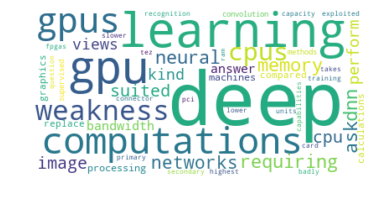

PARTICIPANT:  P15
--------------------------

5 [('weights', 0.4401002000423596), ('layers', 0.29091369155342417), ('learning', 0.2864551526831108), ('deep', 0.22082153591927864), ('initialization', 0.21930416747873513), ('networks', 0.21697538449931034), ('gradients', 0.19705602758207033), ('relu', 0.17678601255938853), ('activation', 0.16485109188027366), ('set', 0.14993244103138015)]


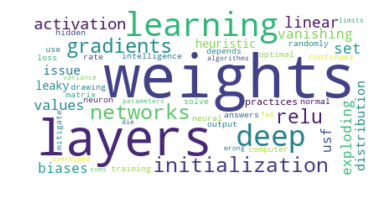

4 [('task', 0.38389391618028285), ('review', 0.26857400460043507), ('windows', 0.19910708915291922), ('full', 0.1805667036579196), ('management', 0.17753196914266045), ('microsoft', 0.17034162138870432), ('share', 0.1623582965663647), ('todoist', 0.14809551411779143), ('ratings', 0.13719317705975864), ('reminders', 0.13482842257599253)]


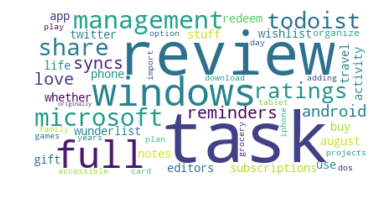

1 [('pdt', 0.34751884989613924), ('attachment', 0.284795935524641), ('thunderbird', 0.24834883663309465), ('product', 0.23478712541763555), ('phrase', 0.23054909066280457), ('comment', 0.22546344895700743), ('bug', 0.2253768205860226), ('component', 0.18901635006546114), ('alias', 0.16189292763454294), ('log', 0.16019771373261055)]


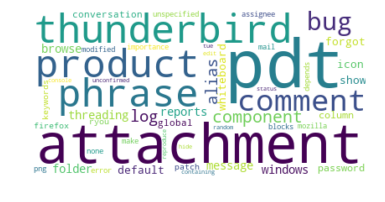

2 [('application', 0.4695729688511939), ('visualizing', 0.42003418273507437), ('usage', 0.4014250733733939), ('patina', 0.3136964149540429), ('heatmaps', 0.21267553556206298), ('todoist', 0.1995076862476575), ('collecting', 0.16179586750572222), ('dynamic', 0.13823909811534096), ('twitter', 0.12134690062929165), ('trello', 0.11556847678980157)]


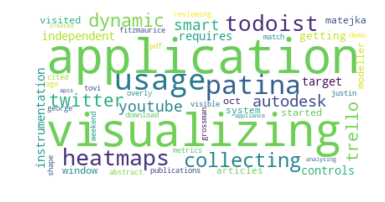

3 [('microsoft', 0.27094889771264996), ('task', 0.22964765794504327), ('project', 0.1857823749667766), ('users', 0.18406216779115825), ('management', 0.17460102832525762), ('replacement', 0.1711997870087133), ('tool', 0.16686009603497526), ('todoist', 0.15497855238816943), ('integration', 0.153958542217838), ('reviews', 0.13847667763727328)]


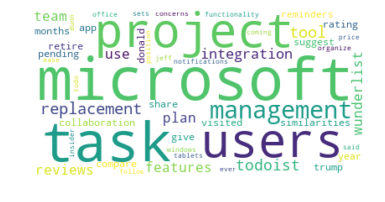

6 [('distributed', 0.5761509238071711), ('blockchain', 0.36392616333249694), ('ledger', 0.245162328165794), ('node', 0.22172947902534482), ('consensus', 0.1764609582465347), ('records', 0.14469870032364154), ('managing', 0.13916610295832582), ('secured', 0.12086597321151235), ('database', 0.11633060944537699), ('technology', 0.11216577105624562)]


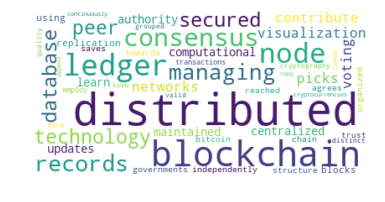

5 [('deep', 0.45082111108897915), ('learning', 0.41232402744542584), ('gpu', 0.3702811597820716), ('computations', 0.31837083925498855), ('gpus', 0.2634010986137856), ('memory', 0.1298718775313747), ('neural', 0.12511552184154814), ('weakness', 0.12096369820611795), ('suited', 0.11903703495046078), ('use', 0.11853049437620349)]


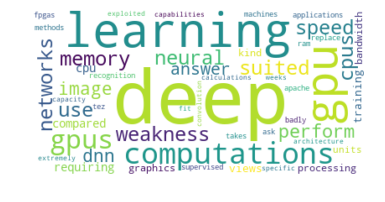

6 [('transaction', 0.3589277699409584), ('block', 0.2435725503394984), ('cryptocurrency', 0.2262597955359556), ('consensus', 0.21730492236170934), ('distributed', 0.20118615064806608), ('computational', 0.1934252605637193), ('blockchain', 0.1874553451142218), ('hash', 0.18208242120967405), ('used', 0.17705771037989768), ('requirement', 0.16012656655210997)]


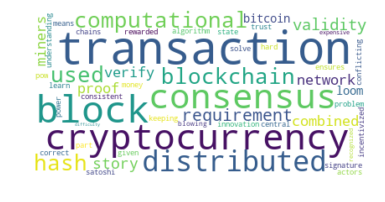

3 [('karma', 0.35725448659497633), ('features', 0.2581257285797182), ('users', 0.25811514141231007), ('completed', 0.2524598371937833), ('make', 0.19902626556130895), ('todoist', 0.19466624713487057), ('microsoft', 0.188663323214412), ('twitter', 0.17988912464195234), ('day', 0.16465162753257775), ('tasks', 0.14835797689133307)]


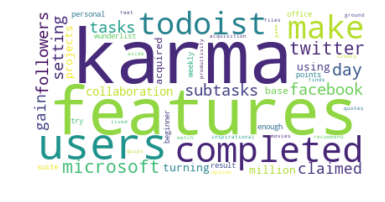

6 [('transactions', 0.38923796688159096), ('require', 0.3392238998610615), ('rare', 0.2154083986603399), ('cryptocurrency', 0.19687325738026415), ('hardness', 0.1786889050350759), ('state', 0.17852523081302074), ('block', 0.17433051798557742), ('story', 0.1727839906184213), ('valid', 0.15880107529145987), ('hash', 0.15429252741252256)]


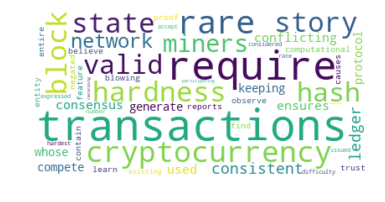

PARTICIPANT:  P16
--------------------------

4 [('ratings', 0.5323810150121867), ('lists', 0.2542762128197178), ('cant', 0.14627033947809576), ('app', 0.14559806952567095), ('compatibility', 0.14551066513960728), ('todo', 0.1441724170346009), ('reviews', 0.13149555771263155), ('person', 0.12691102984128896), ('reminders', 0.12144001506401854), ('attach', 0.12045792662902004)]


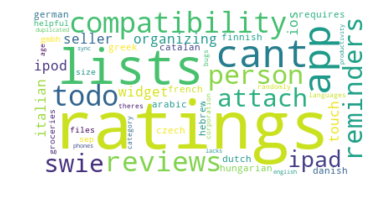

1 [('mail', 0.43272844940867694), ('message', 0.4062747300513315), ('win', 0.2252305262671462), ('reso', 0.22105466293311146), ('window', 0.21231998020323167), ('pdt', 0.16551103942002976), ('status', 0.15892029142968), ('icon', 0.14826564018411326), ('product', 0.14132268724497804), ('attachments', 0.13842017066711806)]


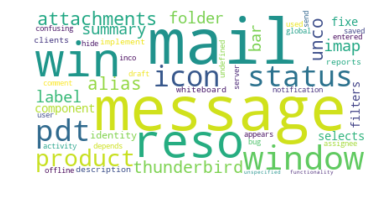

2 [('visualization', 0.8069284616830049), ('library', 0.3042928144549083), ('plots', 0.25420970783639474), ('charts', 0.17469035629886814), ('keyboard', 0.12421164944627311), ('used', 0.11059941389051715), ('matplotlib', 0.0845092957419849), ('activity', 0.0815910967749977), ('types', 0.07883753092708658), ('accessible', 0.0728481550814743)]


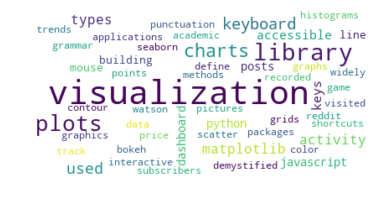

6 [('distributed', 0.4505568132760665), ('ledger', 0.44965928974364405), ('blockchain', 0.2753903989759833), ('consensus', 0.22752221546908935), ('block', 0.17872139282156696), ('proof', 0.17009453073815192), ('cryptocurrency', 0.14001367105790113), ('computational', 0.14001367105790113), ('loom', 0.1398544728213377), ('hash', 0.13553592615464558)]


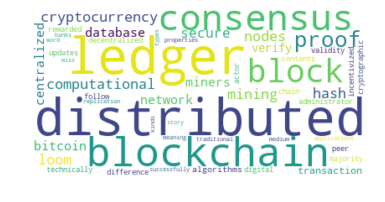

3 [('integrations', 0.3368893213349393), ('features', 0.30577501788097816), ('followers', 0.19478328033547404), ('list', 0.19449985036582704), ('app', 0.1850835881216452), ('reminders', 0.16604152791264754), ('wunderlist', 0.1542069170813326), ('project', 0.14609250854313402), ('todoist', 0.1374452956594486), ('plan', 0.13304609608385218)]


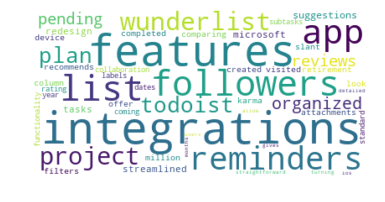

5 [('layer', 0.4081808002382696), ('weights', 0.40542858064383197), ('network', 0.33962338629203037), ('learning', 0.27688793751288676), ('initialization', 0.2687142918220747), ('deep', 0.24029225905838636), ('values', 0.18280952796472527), ('neural', 0.12261923962090203), ('needed', 0.10597602281696401), ('algorithm', 0.10243919697099428)]


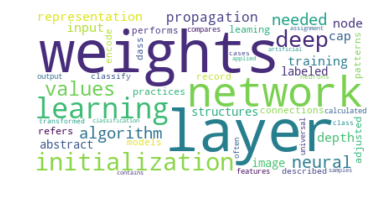

1 [('column', 0.4383679716719491), ('message', 0.3049521770433785), ('pdt', 0.2551392716299183), ('attachment', 0.22585083914975884), ('persist', 0.20388091316242823), ('user', 0.18795384929202524), ('comment', 0.1839426390937198), ('folder', 0.17935839886708507), ('bug', 0.17680343983059385), ('product', 0.16523305210318517)]


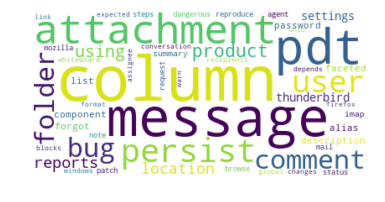

6 [('block', 0.3521122853614439), ('network', 0.29948891084588747), ('miner', 0.28127312735973325), ('loom', 0.27687461754916953), ('follow', 0.23332275612412162), ('miss', 0.2064875664382041), ('updates', 0.18456874738176784), ('mining', 0.1737211805762031), ('bitcoin', 0.16251336247451256), ('medium', 0.15773355769585037)]


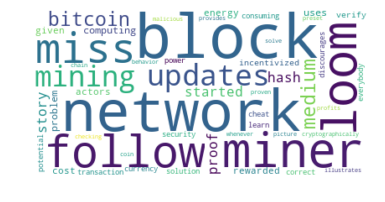

3 [('outlook', 0.27411270681539535), ('todo', 0.1953782059216116), ('wunderlist', 0.19119205408629678), ('list', 0.1906699368379275), ('todoist', 0.1904538608272763), ('remind', 0.17221842568093623), ('bike', 0.17221842568093623), ('project', 0.172049464916046), ('personal', 0.16913337229035033), ('app', 0.15871155068939694)]


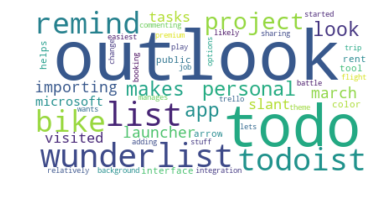

5 [('learning', 0.36683341734808134), ('computing', 0.3518365593600279), ('times', 0.25120013435329624), ('deep', 0.24895635521823514), ('processing', 0.21242793970311355), ('cpu', 0.20376553698072036), ('cores', 0.18621575177059568), ('gpu', 0.16597090347882343), ('networks', 0.15302928418261436), ('applications', 0.1456519000800817)]


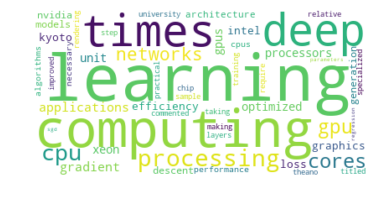

3 [('calendar', 0.4739877602040475), ('integration', 0.46331529765062696), ('outlook', 0.4342150981157645), ('reminders', 0.150973879176104), ('microsoft', 0.13646036344194917), ('posts', 0.12200796049696776), ('uservoice', 0.12025540368957355), ('tasks', 0.11748780733515031), ('mail', 0.10357510315569926), ('rolling', 0.103516294383817)]


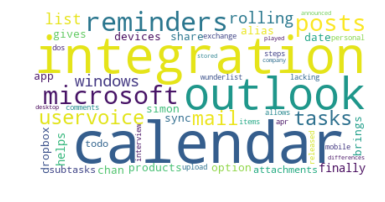

5 [('learning', 0.5103097328419207), ('deep', 0.3140367586719512), ('kyoto', 0.29083473011027783), ('intel', 0.2769854572478837), ('xeon', 0.24011338615746736), ('superior', 0.1570183793359756), ('gpus', 0.1570183793359756), ('phi', 0.1553674851607142), ('task', 0.13739108191897864), ('science', 0.13739108191897864)]


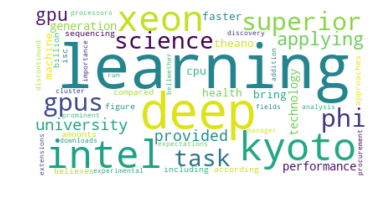

PARTICIPANT:  P17
--------------------------

4 [('task', 0.29051606592636453), ('subscriptions', 0.2545176890156048), ('editors', 0.24570322359515093), ('shop', 0.23711475647366503), ('wishlist', 0.20979289153019745), ('games', 0.20052908831532498), ('gift', 0.19905930173097805), ('activity', 0.19905930173097805), ('todoist', 0.19413121477220893), ('redeem', 0.18442258836840614)]


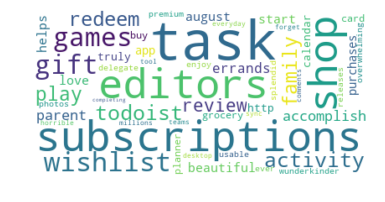

3 [('todoist', 0.43508857542919127), ('works', 0.40167732086837155), ('tasks', 0.28661206437391995), ('reminder', 0.21403244104665053), ('helps', 0.16289030410156916), ('accomplish', 0.1549562614176881), ('shared', 0.15431713020148657), ('premium', 0.15431713020148657), ('integrations', 0.14073365986629077), ('errands', 0.12884003758324628)]


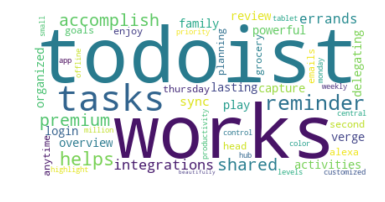

6 [('ledger', 0.5188518011952189), ('blockchain', 0.4351217659339157), ('block', 0.24445582655669212), ('database', 0.21756088296695786), ('distributed', 0.15490459258447525), ('proof', 0.1421059073337224), ('links', 0.14119845384610508), ('bitcoin', 0.11277590901775061), ('transactions', 0.11071041617859768), ('consensus', 0.10657943050029178)]


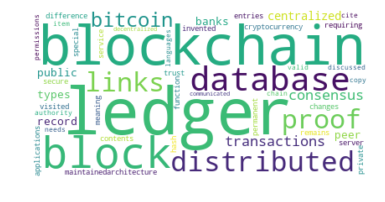

6 [('proof', 0.395184248640301), ('required', 0.2888294658141662), ('useful', 0.28022155812675886), ('block', 0.27568547735508564), ('ledger', 0.2428586837098577), ('generation', 0.23198716828891117), ('blockchain', 0.17872523072626287), ('processes', 0.17721242022069603), ('changes', 0.15206922405056808), ('money', 0.13676024176359813)]


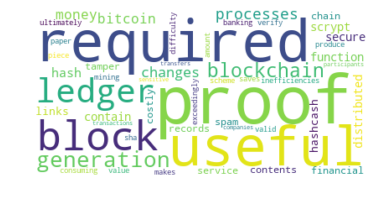

1 [('folder', 0.42149291577805675), ('unco', 0.30057281698926996), ('filters', 0.29193566707578517), ('reso', 0.2759569397358384), ('move', 0.26431130357097593), ('delete', 0.2120420303760511), ('pdt', 0.17299541917753114), ('imap', 0.17101556828699843), ('trash', 0.15605704207319626), ('attachment', 0.14424040355519563)]


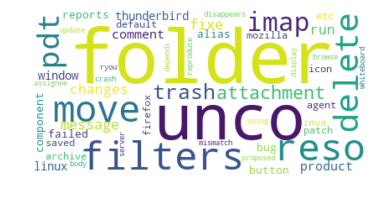

3 [('todoist', 0.5156127212134276), ('sharing', 0.21126709220958453), ('year', 0.19127568690175542), ('tool', 0.17580967813245146), ('wunderlist', 0.17264892327746895), ('tasks', 0.15816155612587843), ('created', 0.14679823630396902), ('retiring', 0.1438913405355736), ('app', 0.13545220403476224), ('stuff', 0.13514043096319675)]


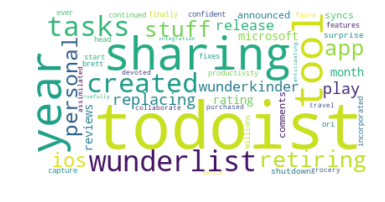

1 [('bug', 0.3434716185768907), ('column', 0.330558254780434), ('summary', 0.29426365029939916), ('conversation', 0.2927874112510746), ('message', 0.2740016893664788), ('reso', 0.21574365864265563), ('books', 0.1846511901912141), ('alias', 0.18020940898386528), ('product', 0.18007862589488122), ('pdt', 0.16278527884229632)]


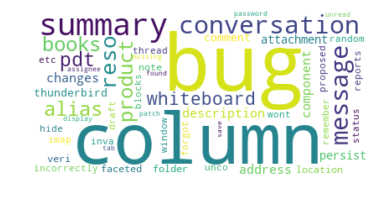

3 [('policy', 0.25583771690991985), ('porting', 0.22360682640383187), ('year', 0.1993037231889753), ('reber', 0.19895138897002013), ('microsoft', 0.1888737343423351), ('wunderlist', 0.18619467428074168), ('line', 0.1790864018369439), ('azure', 0.1720052510798707), ('mobile', 0.15082443917003535), ('acquired', 0.13442661416893253)]


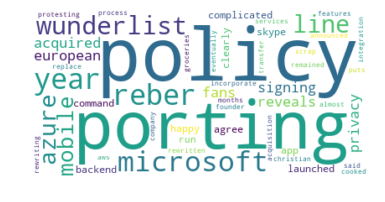

4 [('chairs', 0.3033135457998318), ('office', 0.27893032370768045), ('microsoft', 0.26093481895234627), ('helpful', 0.22748515934987382), ('app', 0.21594605706401065), ('bristol', 0.2022090305332212), ('bmw', 0.2022090305332212), ('covering', 0.2022090305332212), ('ordered', 0.2022090305332212), ('task', 0.17715829394805463)]


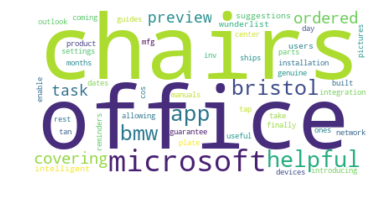

5 [('values', 0.39447524611794127), ('neural', 0.34382833386771733), ('weights', 0.2575962955071783), ('learning', 0.24966787728983625), ('layer', 0.24096143041491308), ('output', 0.2176222342752487), ('correct', 0.17725173284447795), ('class', 0.17709745316118505), ('training', 0.17540442195311454), ('hidden', 0.16904756892658573)]


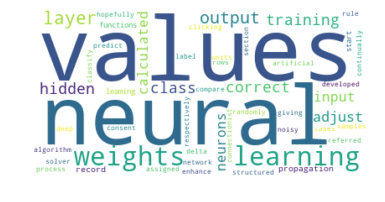

3 [('integrates', 0.3396983191698867), ('tasks', 0.31543019200552574), ('todoist', 0.308690854893725), ('creating', 0.27099528832653885), ('date', 0.24859175040114137), ('ensure', 0.20761508824710712), ('folders', 0.20488331077017147), ('trello', 0.13482292033016657), ('share', 0.13255432193228323), ('motivating', 0.11450505140557979)]


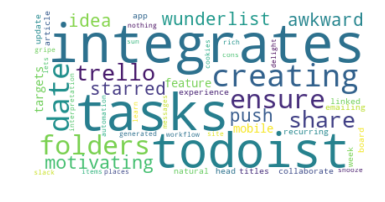

5 [('deep', 0.5318452153698515), ('learning', 0.43864339362940413), ('gpu', 0.41834166330921246), ('nvidia', 0.19295603850308637), ('computing', 0.14917609699398274), ('processing', 0.1472591606806906), ('training', 0.13782574178791884), ('specialised', 0.12432320317002317), ('cpus', 0.11678846358396117), ('gpus', 0.11188207274548706)]


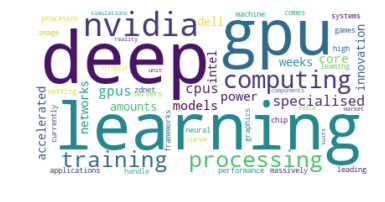

2 [('visualization', 0.5647466669380672), ('libraries', 0.46730018323110656), ('python', 0.3272964518927089), ('matplotlib', 0.30790526029617654), ('plotting', 0.23884239817366967), ('chart', 0.14174033993739724), ('representation', 0.1325249437111582), ('object', 0.09080240527239511), ('times', 0.08734598562780882), ('docs', 0.07337929100516356)]


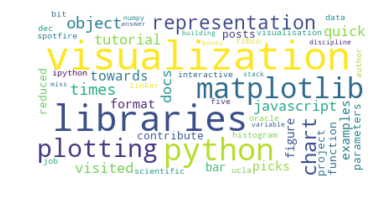

5 [('loading', 0.7442945643507526), ('gmail', 0.3383157110685239), ('slow', 0.24809818811691753), ('view', 0.20298942664111433), ('basic', 0.18607364108768815), ('google', 0.17176028408094293), ('html', 0.15949169236087554), ('connections', 0.15949169236087554), ('standard', 0.14885891287015054), ('url', 0.13532628442740957)]


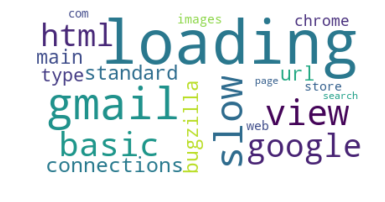

2 [('charting', 0.6225200518968592), ('libraries', 0.3620720637665035), ('javascript', 0.2828600044194335), ('learning', 0.2646871638568922), ('visualization', 0.1872786536723294), ('albers', 0.136176261352438), ('deep', 0.1163616982631784), ('nvidia', 0.1163616982631784), ('times', 0.09051520141421872), ('frameworks', 0.08989375376271812)]


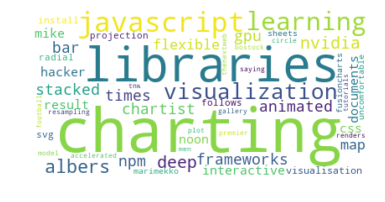

PARTICIPANT:  P18
--------------------------

4 [('tasks', 0.531538405049945), ('app', 0.2562408497648563), ('productivity', 0.21999077529579064), ('day', 0.19837318465978807), ('ratings', 0.19603784664207638), ('wunderlist', 0.19123299745967254), ('todoist', 0.16240390236524954), ('management', 0.15375517383692267), ('reviews', 0.1360636587089572), ('travel', 0.1271622978588385)]


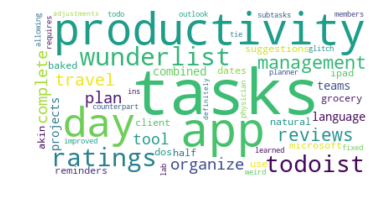

1 [('message', 0.5883531158903066), ('bug', 0.2684550220190157), ('unco', 0.26273036380860004), ('mail', 0.21874112905253132), ('folder', 0.21582731420260173), ('imap', 0.17332142549716573), ('pdt', 0.16929069467165023), ('reso', 0.1678249743714628), ('product', 0.1418084390431356), ('changed', 0.14107557889304187)]


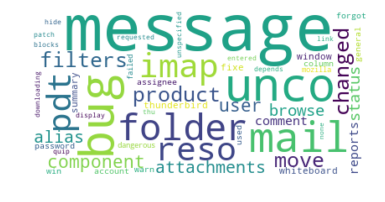

2 [('visualization', 0.5018861965923497), ('representations', 0.35553725232609174), ('chart', 0.30942707456800245), ('tableau', 0.24397134725554037), ('seaborn', 0.209755853433117), ('library', 0.19726245032608264), ('comparing', 0.16731164815345492), ('plots', 0.1517382769516166), ('javascript', 0.13388671495730875), ('matplotlib', 0.12496093396015481)]


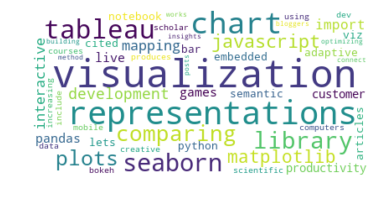

3 [('lists', 0.4121615113441394), ('tasks', 0.3690228751181672), ('wunderlist', 0.2851938736171461), ('todoist', 0.20880265746969626), ('day', 0.18680826043326304), ('dates', 0.17697298407492548), ('family', 0.1714961079387333), ('use', 0.14087180294967377), ('projects', 0.13168451145295593), ('windows', 0.12555965045514403)]


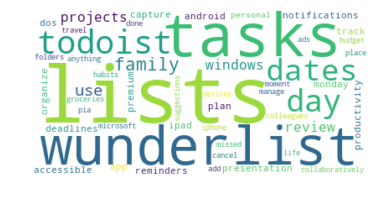

6 [('blockchain', 0.6549293115057564), ('audit', 0.27107803158819205), ('train', 0.18398757581636963), ('computers', 0.14675199499639008), ('exists', 0.14502182928516838), ('spreadsheet', 0.13799068186227723), ('developers', 0.13518984085905525), ('digital', 0.12535785243294215), ('technology', 0.12115314341527396), ('records', 0.11170674245993872)]


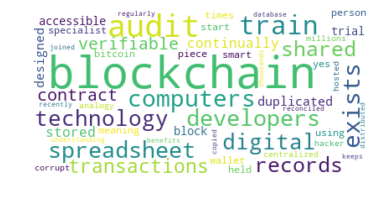

5 [('geforce', 0.3430179161967107), ('gpu', 0.3168923878894243), ('gtx', 0.20511038075333224), ('sec', 0.1979275269526319), ('examples', 0.19154276801867604), ('cpu', 0.183215698209022), ('node', 0.18196562961774224), ('nvidia', 0.1779751552840198), ('deep', 0.17063436270969), ('compute', 0.157685848042667)]


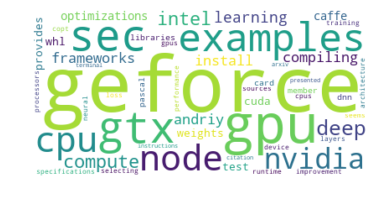

6 [('loom', 0.42950377533124645), ('hash', 0.33924631796802135), ('block', 0.27189874852902435), ('blockchain', 0.2530556884029753), ('mathematical', 0.20933797453119574), ('used', 0.18768232199348583), ('actor', 0.1696359448787276), ('started', 0.1668650588379292), ('proof', 0.15583265825360332), ('miss', 0.1516955080344811)]


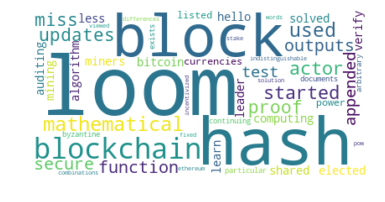

2 [('visualization', 0.531516971467587), ('seaborn', 0.41879028971778587), ('year', 0.23698208918937003), ('notebook', 0.20939514485889293), ('cpsc', 0.15951832179203315), ('game', 0.15252238946511956), ('esl', 0.14911495297950925), ('stat', 0.14217937377115997), ('kaggle', 0.132032878262649), ('customizations', 0.11790484654193756)]


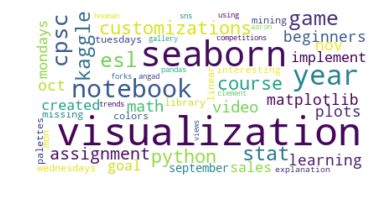

5 [('learning', 0.32534214904790754), ('weights', 0.26020124827180013), ('deep', 0.24417238847584075), ('derivative', 0.21431902966218971), ('neural', 0.2120097487789668), ('image', 0.18816205970068192), ('neurons', 0.18816205970068192), ('picks', 0.1804791828734229), ('cat', 0.17201922117623122), ('direction', 0.16778924032763537)]


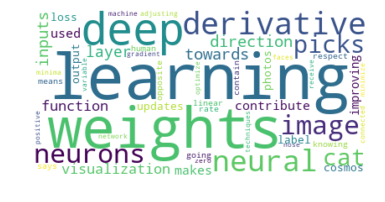

1 [('message', 0.5541306461159363), ('folder', 0.3011859805267992), ('move', 0.2664163845739303), ('imap', 0.23819430993686141), ('mail', 0.21752486359860612), ('unco', 0.21539087363010978), ('bug', 0.20664862041867582), ('thunderbird', 0.17858928830337192), ('filters', 0.14765789450114442), ('product', 0.13794950082599275)]


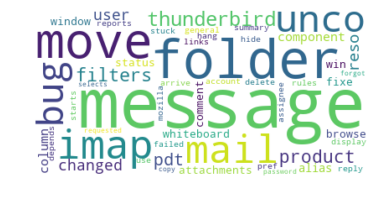

5 [('caffe', 0.26065216013229736), ('library', 0.2556480421728394), ('intel', 0.21304003514403283), ('nvidia', 0.21185426713949285), ('deep', 0.20167789993635107), ('learning', 0.18584202034525127), ('optimizations', 0.17971906931496306), ('cpus', 0.1661712274123456), ('gpu', 0.16049015980850473), ('provides', 0.15622935910562408)]


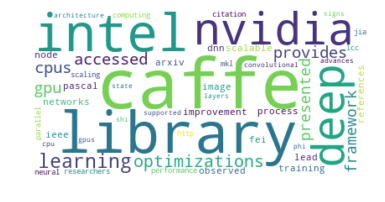

PARTICIPANT:  P19
--------------------------

3 [('app', 0.5594553372137991), ('wunderlist', 0.3029567490083653), ('teams', 0.22384065531828257), ('productivity', 0.19779906273877), ('manager', 0.16970925501255413), ('tool', 0.16649063121059188), ('similarities', 0.15548501433936618), ('integrations', 0.15115261455901233), ('differences', 0.14019493675197697), ('microsoft', 0.12186880122884276)]


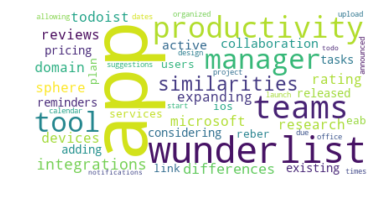

1 [('thread', 0.4473538493369465), ('message', 0.3047045712059571), ('bug', 0.2845955572975525), ('pdt', 0.2280999668045686), ('reso', 0.18797366579508662), ('attachment', 0.18772269961912524), ('fixe', 0.17191183053355721), ('folder', 0.16714347319029066), ('unread', 0.16613960848644507), ('product', 0.16036738643933293)]


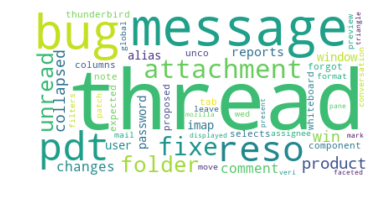

5 [('weights', 0.5433583773910099), ('learning', 0.4104309892920785), ('neurons', 0.2738100058617442), ('neural', 0.22127759888097845), ('ask', 0.1514891664035941), ('understanding', 0.14080479194691745), ('explaining', 0.13681032976402616), ('machine', 0.13581171421830335), ('mean', 0.13376171076062035), ('artificial', 0.13215012388398636)]


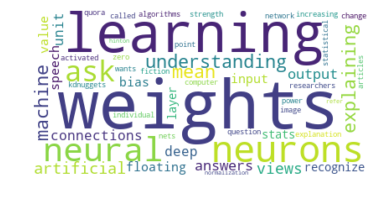

2 [('visualization', 0.523500621531734), ('libraries', 0.4468522286433141), ('plots', 0.38729744625281654), ('javascript', 0.2147576830737499), ('using', 0.1916209822210498), ('bokeh', 0.18608965489920506), ('learning', 0.14632998993750607), ('charts', 0.14464138964927586), ('examples', 0.10790520840715374), ('framework', 0.09010593647514507)]


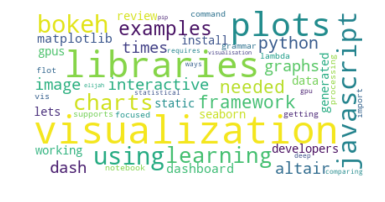

6 [('image', 0.5163557702647197), ('static', 0.377181754060557), ('blockchain', 0.3489435478742051), ('ledger', 0.211570437676825), ('consensus', 0.20740697258672208), ('supported', 0.17524016049999644), ('mechanism', 0.16669185998780153), ('database', 0.16094386481580836), ('matplotlib', 0.12707192783858337), ('traditional', 0.12544373522714997)]


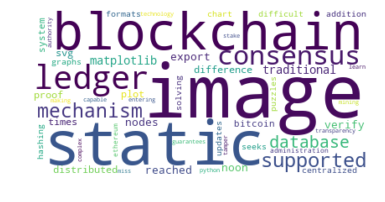

4 [('app', 0.668974474785354), ('review', 0.2604929389891983), ('shop', 0.21594213127565665), ('activity', 0.16377123821536144), ('subscriptions', 0.15774629588305178), ('ratings', 0.14607850056882657), ('editors', 0.13812058301497257), ('wishlist', 0.13775028654576355), ('completed', 0.13609798189642228), ('redeem', 0.12997406069237366)]


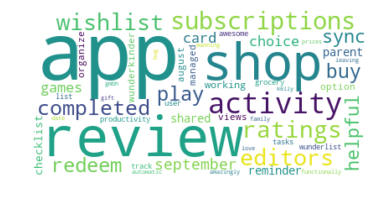

3 [('apps', 0.48238206946825724), ('actively', 0.29294889199090673), ('option', 0.27231245857079034), ('productivity', 0.27069155107929754), ('projects', 0.250371689050162), ('task', 0.20747615891107837), ('wunderlist', 0.20213909886318943), ('tool', 0.17116783110163966), ('teams', 0.15460868159749472), ('manager', 0.12156806186196)]


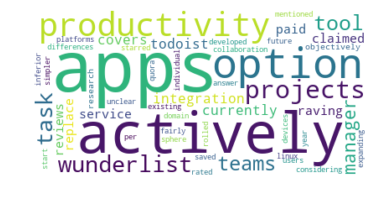

5 [('learning', 0.4116041539147918), ('using', 0.33090382449120964), ('training', 0.21262446663750487), ('gpu', 0.19072867049866396), ('benchmark', 0.19038302231001103), ('intel', 0.18685741078575158), ('caffe', 0.18344512881325134), ('gpus', 0.1666721856551161), ('compute', 0.15759890791516437), ('cpus', 0.15059720328228765)]


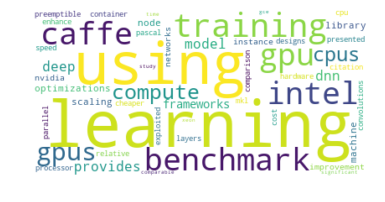

6 [('plot', 0.44991489361094233), ('graphing', 0.37674331403160505), ('charts', 0.3131667961966352), ('image', 0.30446771852450644), ('static', 0.2087778641310901), ('dash', 0.19569941539494046), ('start', 0.1855803236720801), ('notebooks', 0.15069732561264204), ('pandas', 0.12974289955292292), ('matplotlib', 0.12951960089613923)]


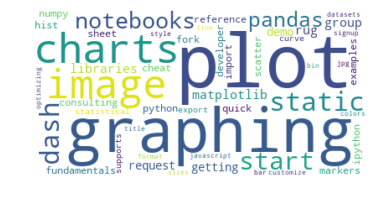

In [15]:
for participant in participants:
    print("PARTICIPANT: ", participant)
    print("--------------------------")
    print()
    index = 0
    
    tasks = te.get_tasks_for_participant(path_to_data, participant, ungrouped=True)
    if not os.path.exists(f"../wordclouds/task segments rake tfidf/{participant}"):
        os.mkdir(f"../wordclouds/task segments rake tfidf/{participant}")
    for task, order in zip(tasks[0], tasks[1]):
        print(order, task.most_common(10))
        wc = WordCloud(background_color="white", max_words=50)
        wc.generate_from_frequencies(task)
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.savefig(f'../wordclouds/task segments rake tfidf/{participant}/wc{index}_label_{order}.png', bbox_inches='tight')
        plt.show()
        index += 1

